In [1]:
import jax
import joblib
import jax.numpy as jnp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from tqdm.auto import tqdm
from itertools import product
from toolz import pluck, valmap, keyfilter, compose
from aging.behavior.bio_age_model import fit_model, masked_xval, stratified_xval
from aging.plotting import (
    figure,
    format_plots,
    add_identity,
    legend,
    PlotConfig,
    save_factory,
)
from sklearn.preprocessing import OneHotEncoder

In [2]:
format_plots()

In [3]:
c = PlotConfig()
saver = save_factory(c.save_path / "bio_age_model", tight_layout=False)

In [4]:
def zscore(ser: pd.Series):
    return (ser - ser.mean()) / ser.std()


def demean(ser: pd.Series):
    return ser - ser.mean()

# Ontogeny

In [5]:
df = pd.read_parquet(
    "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_relabeled_counts_matrix_v00.parquet"
)
df = df.sort_index(axis=1)

n_syllables = 70
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))[:, :n_syllables]

pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_mouse_area_df_v00.parquet'
size_df = pd.read_parquet(pth)

sizes_col = zscore(size_df.groupby('age')['quant_0.5'].transform(demean))
# sizes_col = size_df.groupby('age')['quant_0.5'].transform(zscore)
# sizes_col = size_df['quant_0.5']
sizes_col = sizes_col.loc[df.index]

In [11]:
features = {
    "ages": age,
    "counts": syllable_counts_jax + 1,
    "sizes": sizes_col.to_numpy(),
}

hypparams = {
    "min_age": 1,
    "max_age": 115,
    "age_sd": 26,  # weeks
    "bio_params_sd": 0.3,
    "size_params_sd": 0.3,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_size_splines": 5,
    "n_syllables": n_syllables,
    "n_keep_sylls": 30,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 250,
}

## Run gridsearch

On:
- n_splines
- age_sd
- n_heldout_sylls

In [7]:
save_path = Path('/n/scratch/users/w/wg41/bio-age-model')
save_path.mkdir(exist_ok=True)

In [12]:
mdl_v1 = masked_xval(features, hypparams, 1, n_repeats=1)

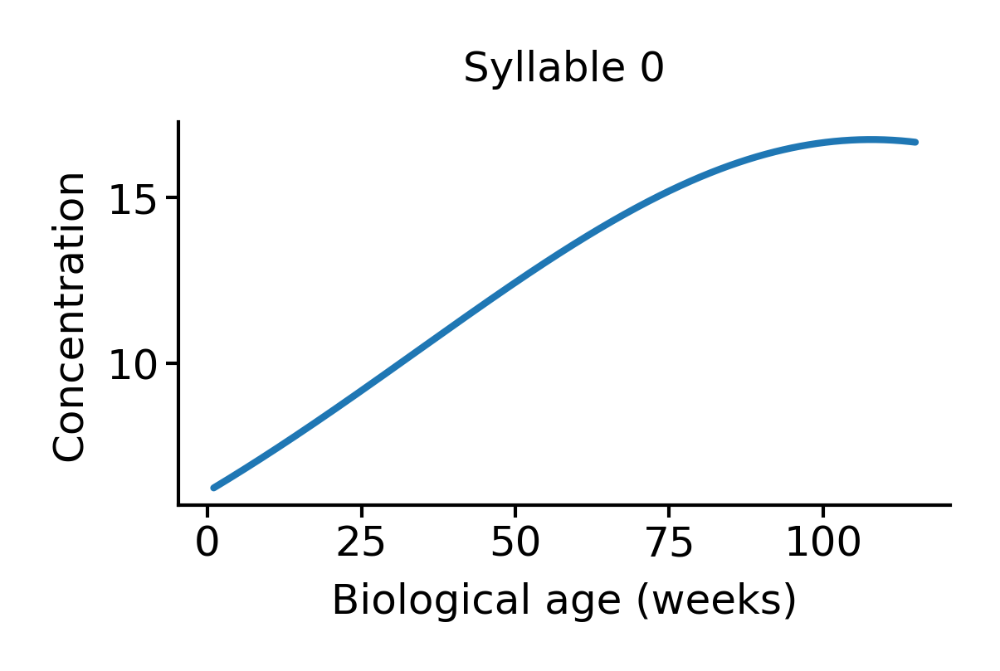

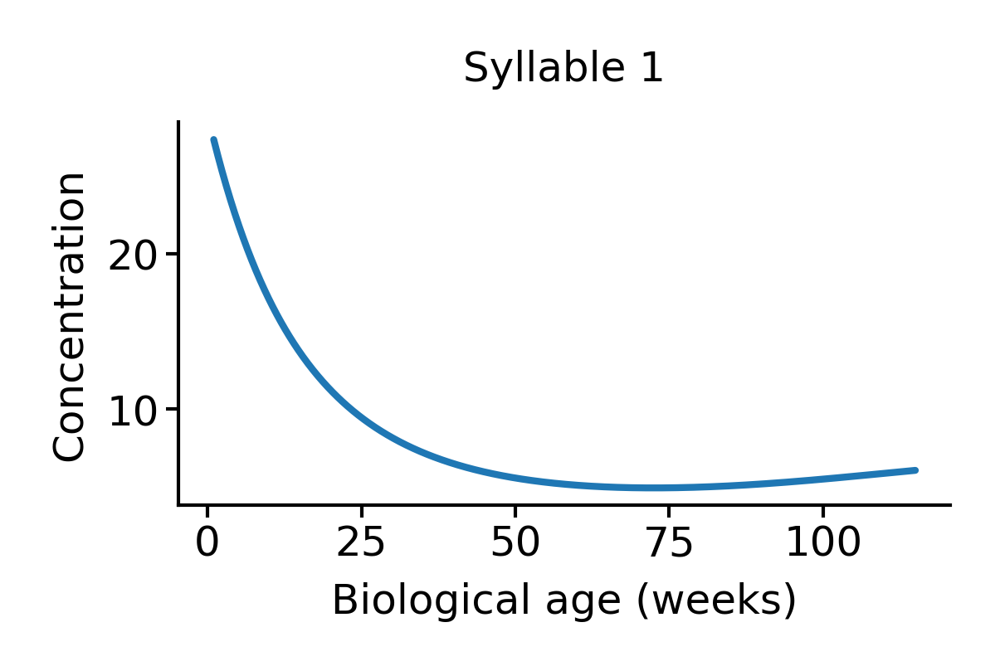

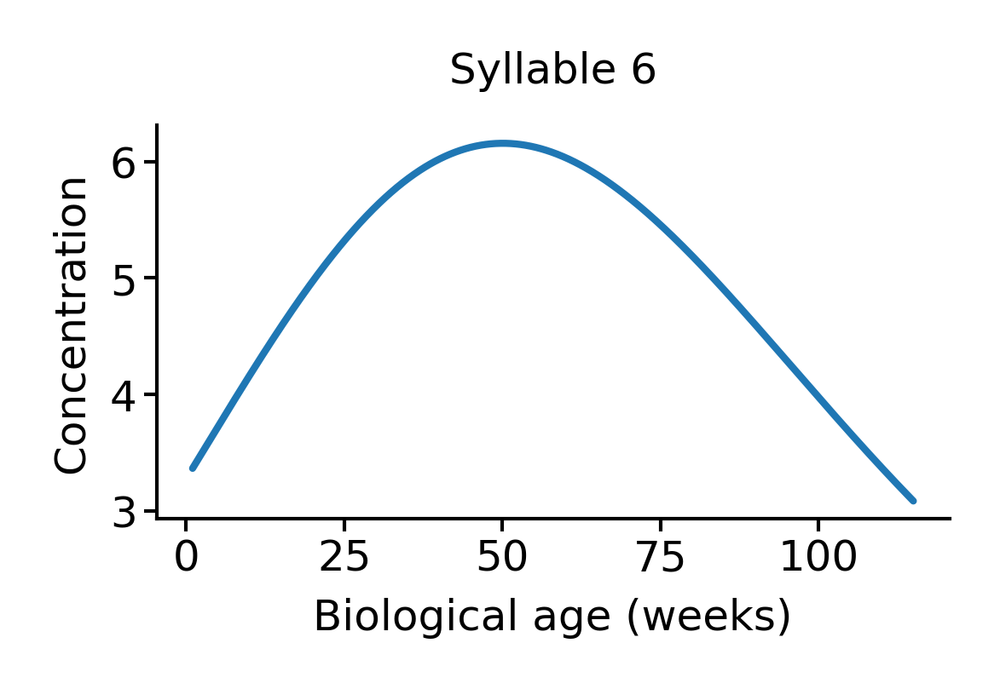

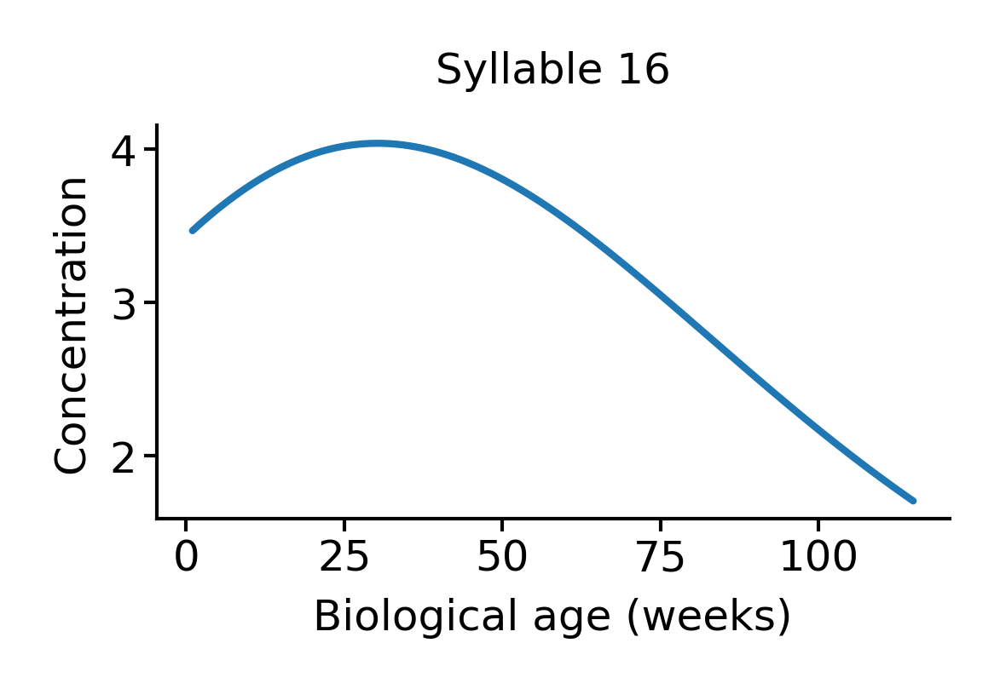

In [17]:
for syllable in (0, 1, 6, 16):
    figure(2, 1)
    plt.plot(np.linspace(1, 115, 1000), mdl_v1[0]['concentrations'][0, :, syllable])
    plt.xlabel("Biological age (weeks)")
    plt.ylabel("Concentration")
    plt.title(f"Syllable {syllable}")
    sns.despine()

In [59]:
mdl_v2 = masked_xval(features, hypparams, 2, n_repeats=10)

In [60]:
print("Model v1", np.mean(list(pluck("heldout_r2_total", mdl_v1.values()))))
print("Model v2", np.mean(list(pluck("heldout_r2_total", mdl_v2.values()))))

Model v1 0.4683546381349782
Model v2 0.4760820910679497


In [63]:
print("Model v1", np.mean(list(pluck("heldout_r2_total_v2", mdl_v1.values()))))
print("Model v2", np.mean(list(pluck("heldout_r2_total_v2", mdl_v2.values()))))

Model v1 0.4509964016042961
Model v2 0.4585366070497165


In [61]:
print("Model v1", np.mean(list(pluck("heldout_ll", mdl_v1.values()))))
print("Model v2", np.mean(list(pluck("heldout_ll", mdl_v2.values()))))

Model v1 -415418.5
Model v2 -415283.1


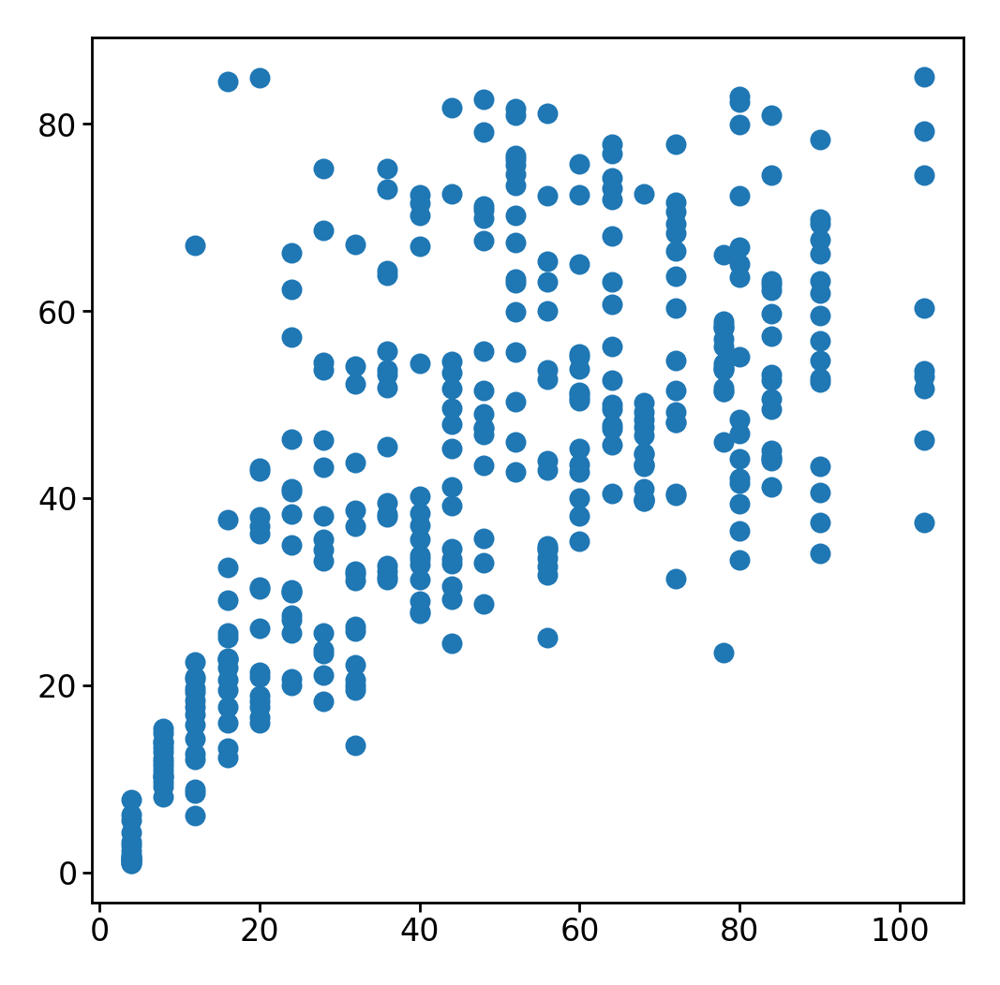

In [62]:
avg = np.mean(list(pluck("bio_ages", mdl_v2.values())), axis=0)
plt.scatter(mdl_v2[0]['true_ages'], avg, s=10)

## Optimize number of syllables to run on

In [11]:
outs = {}

for n_keep in tqdm(range(20, n_syllables - 5, 5)):
    hypparams["n_keep_sylls"] = n_keep
    outs[n_keep] = masked_xval(features, hypparams, 1, n_repeats=5)

heldout_r2 = valmap(lambda v: list(pluck("heldout_r2_total", v.values())), outs)
heldout_r2 = pd.DataFrame(heldout_r2)

heldout_r2_v2 = valmap(lambda v: list(pluck("heldout_r2_total_v2", v.values())), outs)
heldout_r2_v2 = pd.DataFrame(heldout_r2_v2)

heldout_ll = valmap(lambda v: list(pluck("heldout_ll", v.values())), outs)
heldout_ll = pd.DataFrame(heldout_ll)
heldout_ll.mean().sort_values(ascending=False)

  0%|          | 0/9 [00:00<?, ?it/s]

60   -370490.2
55   -377833.2
50   -385198.2
45   -392623.4
40   -400122.2
35   -407664.8
30   -415358.0
25   -423275.2
20   -431477.6
dtype: float64

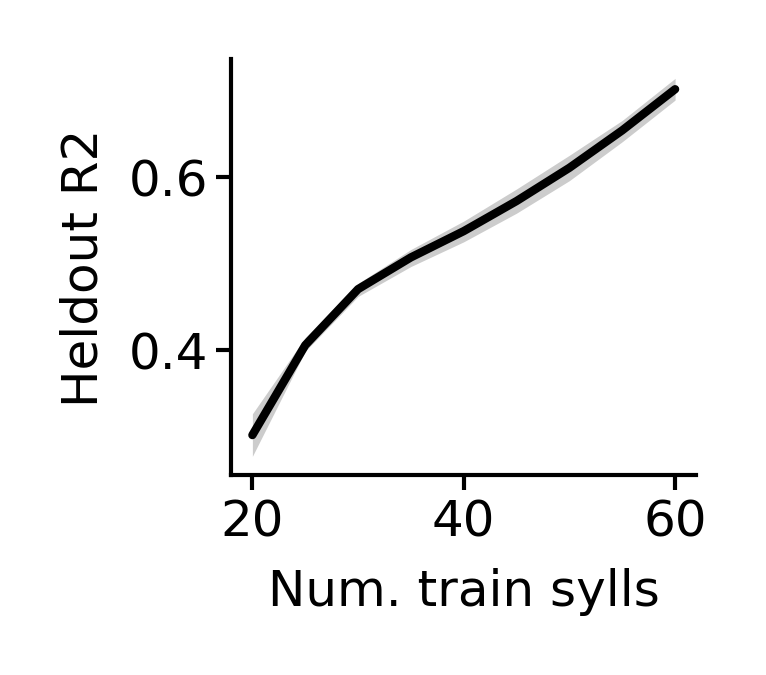

In [12]:
fig = figure(1, 0.9)
ax = sns.lineplot(
    data=heldout_r2.melt(),
    x="variable",
    y="value",
    errorbar=("ci", 95),
    color="k",
    err_kws={"lw": 0},
)
ax.set(xlabel="Num. train sylls", ylabel="Heldout R2")
# ax.axvline(5, color='silver', ls='--', zorder=-1)
sns.despine()
# saver(fig, "n-keep-sylls-heldout-r2");

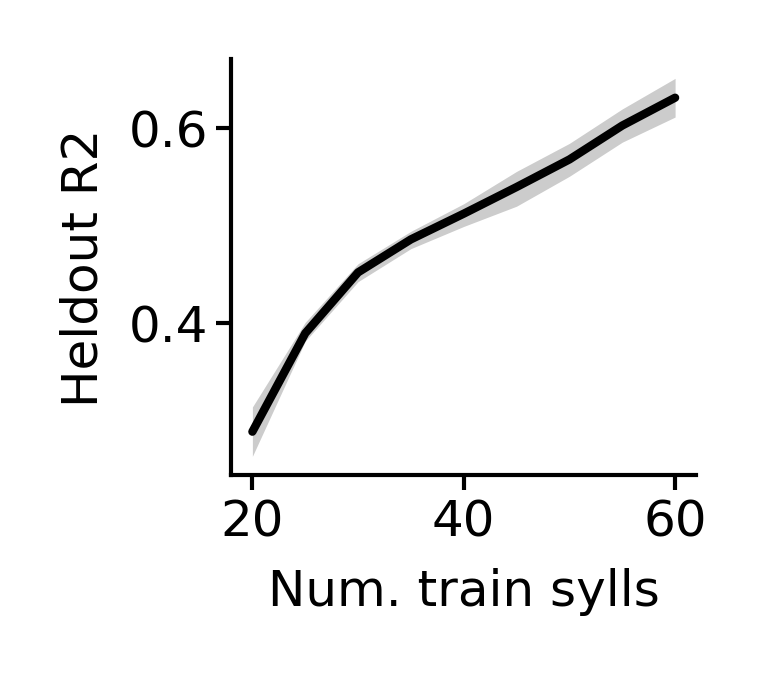

In [13]:
fig = figure(1, 0.9)
ax = sns.lineplot(
    data=heldout_r2_v2.melt(),
    x="variable",
    y="value",
    errorbar=("ci", 95),
    color="k",
    err_kws={"lw": 0},
)
ax.set(xlabel="Num. train sylls", ylabel="Heldout R2")
# ax.axvline(5, color='silver', ls='--', zorder=-1)
sns.despine()
# saver(fig, "n-keep-sylls-heldout-r2");

## Optimize `n_splines`

In [5]:
keep_keys = ['heldout_ll', 'heldout_r2_total', 'heldout_r2_total_v2']

In [84]:
outs = []

for n_splines in tqdm(range(4, 20)):

    hypparams["n_splines"] = n_splines

    tmp = masked_xval(features, hypparams, 2, n_repeats=5)
    tmp = valmap(lambda v: keyfilter(lambda k: k in keep_keys, v), tmp)
    for k, v in tmp.items():
        outs.append({
            "repeat": k,
            "n_splines": n_splines,
            **v
        })
outs_df = pd.DataFrame(outs)

  0%|          | 0/16 [00:00<?, ?it/s]

/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/scipy/optimize/_nnls.py:135: LinAlgWarning: Ill-conditioned matrix (rcond=4.33377e-19): result may not be accurate.
  s[P] = solve(AtA[P_ind[:, None], P_ind[None, :]], Atb[P],
/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/scipy/optimize/_nnls.py:135: LinAlgWarning: Ill-conditioned matrix (rcond=4.33749e-19): result may not be accurate.
  s[P] = solve(AtA[P_ind[:, None], P_ind[None, :]], Atb[P],
/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/scipy/optimize/_nnls.py:135: LinAlgWarning: Ill-conditioned matrix (rcond=7.57871e-21): result may not be accurate.
  s[P] = solve(AtA[P_ind[:, None], P_ind[None, :]], Atb[P],
/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/scipy/optimize/_nnls.py:135: LinAlgWarning: Ill-conditioned matrix (rcond=4.33547e-19): result may not be accurate.
  s[P] = solve(AtA[P_ind[:, None], P_ind[None, :]], Atb[P],
/home/wg41/miniconda3/envs/aging

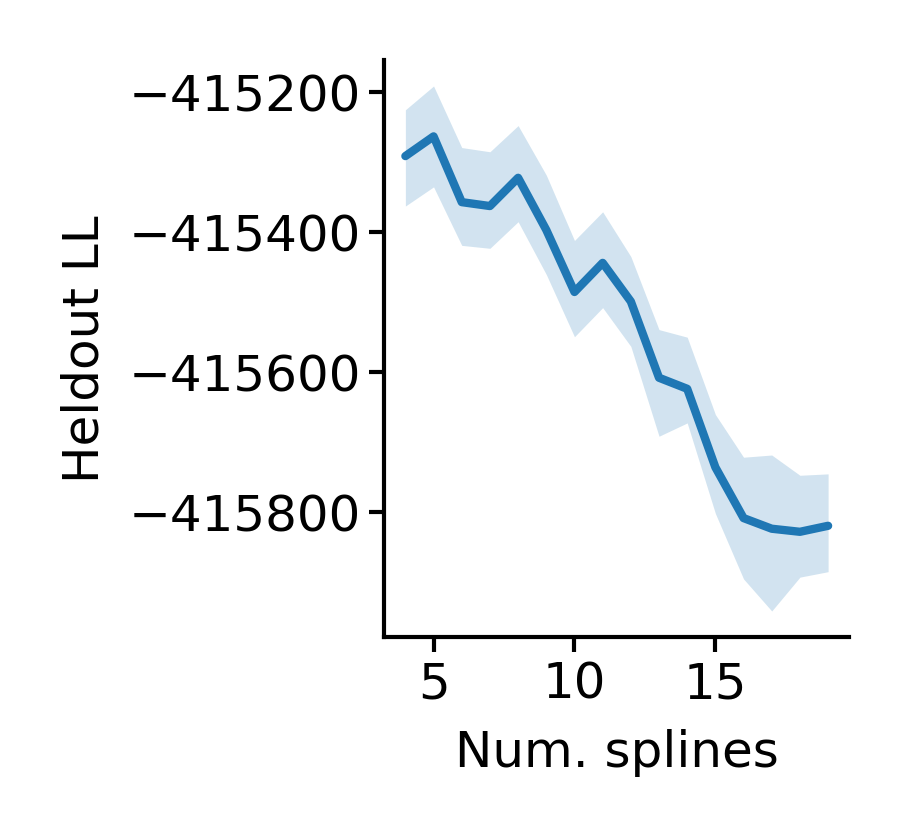

In [85]:
figure(1, 1.25)
ax = sns.lineplot(data=outs_df, x='n_splines', y='heldout_ll', err_kws=dict(lw=0))
ax.set(ylabel="Heldout LL", xlabel="Num. splines")
sns.despine()

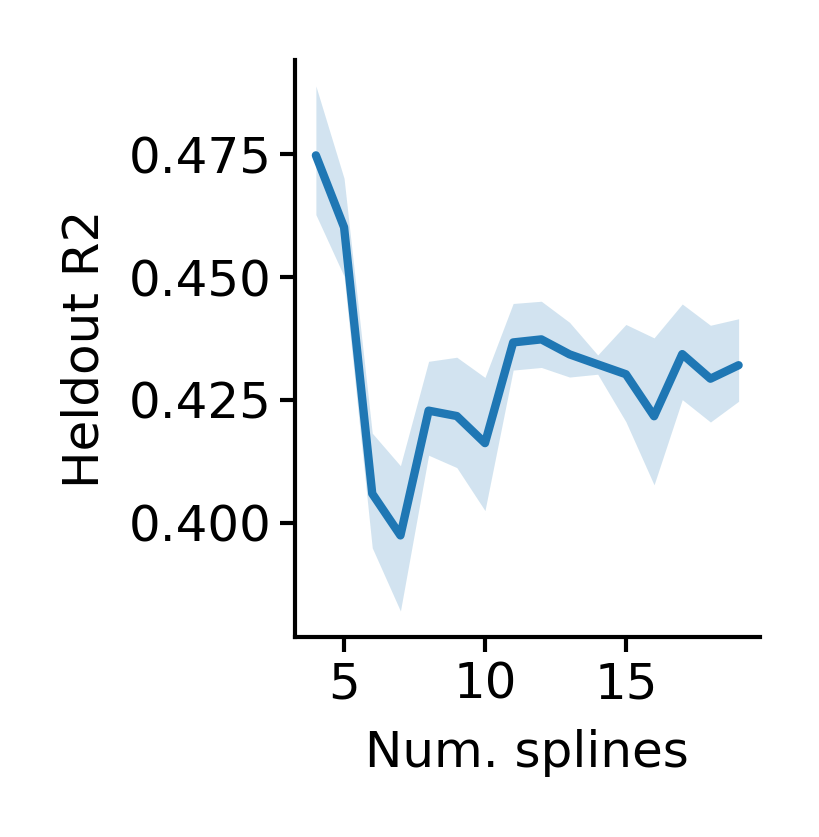

In [86]:
figure(1, 1.25)
ax = sns.lineplot(data=outs_df, x='n_splines', y='heldout_r2_total_v2', err_kws=dict(lw=0))
ax.set(ylabel="Heldout R2", xlabel="Num. splines")
sns.despine()

## Optimize `age_sd`

In [8]:
outs = []
hypparams["n_splines"] = 4

for age_sd in tqdm(np.linspace(1, 50, 16)):

    hypparams["age_sd"] = float(age_sd)

    tmp = masked_xval(features, hypparams, 2, n_repeats=5)
    tmp = valmap(lambda v: keyfilter(lambda k: k in keep_keys, v), tmp)
    for k, v in tmp.items():
        outs.append({
            "repeat": k,
            "age_sd": age_sd,
            **v
        })
age_sd_df = pd.DataFrame(outs)

  0%|          | 0/16 [00:00<?, ?it/s]

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive
findfont: Font family ['Liberation Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Liberation Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Liberation Sans'] not found. Falling back to DejaVu Sans.


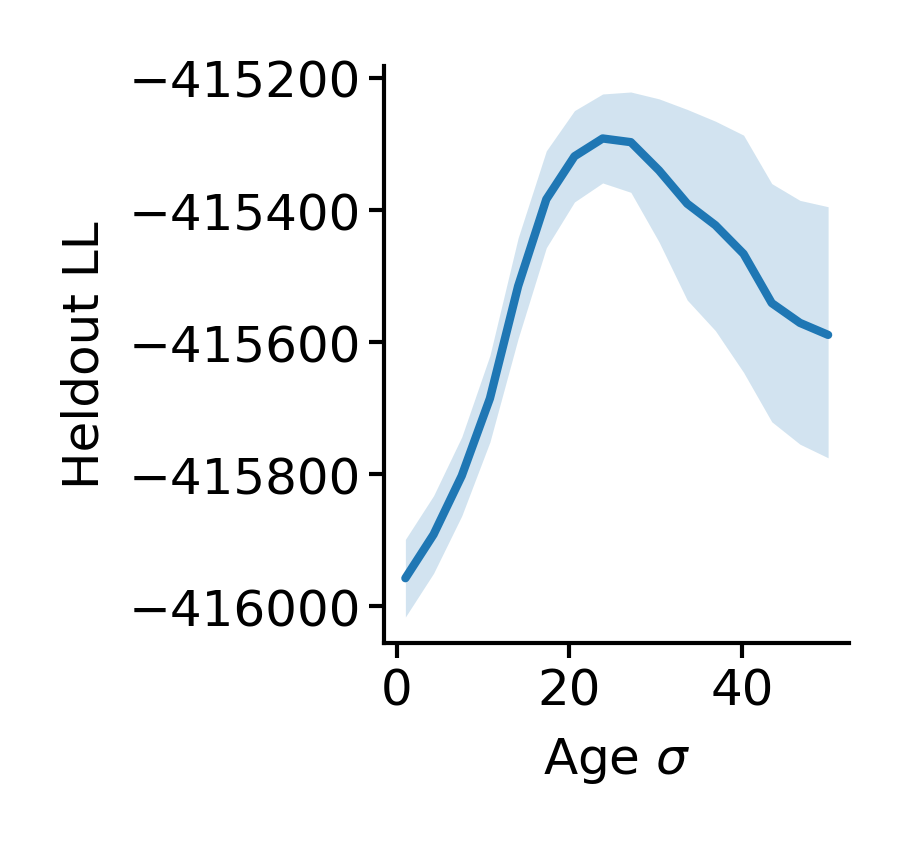

In [9]:
figure(1, 1.25)
ax = sns.lineplot(data=age_sd_df, x='age_sd', y='heldout_ll', err_kws=dict(lw=0))
ax.set(ylabel="Heldout LL", xlabel=r"Age $\sigma$")
sns.despine()

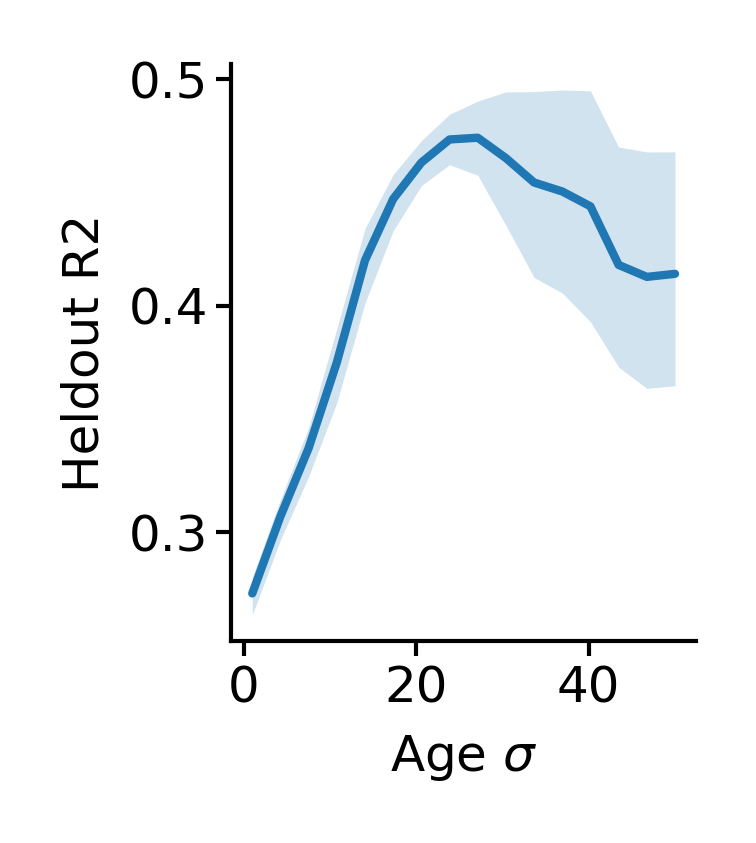

In [10]:
figure(1, 1.25)
ax = sns.lineplot(data=age_sd_df, x='age_sd', y='heldout_r2_total_v2', err_kws=dict(lw=0))
ax.set(ylabel="Heldout R2", xlabel=r"Age $\sigma$")
sns.despine()

In [11]:
hypparams["age_sd"] = 26
hypparams["n_splines"] = 4

tmp = masked_xval(features, hypparams, 2, n_repeats=5)

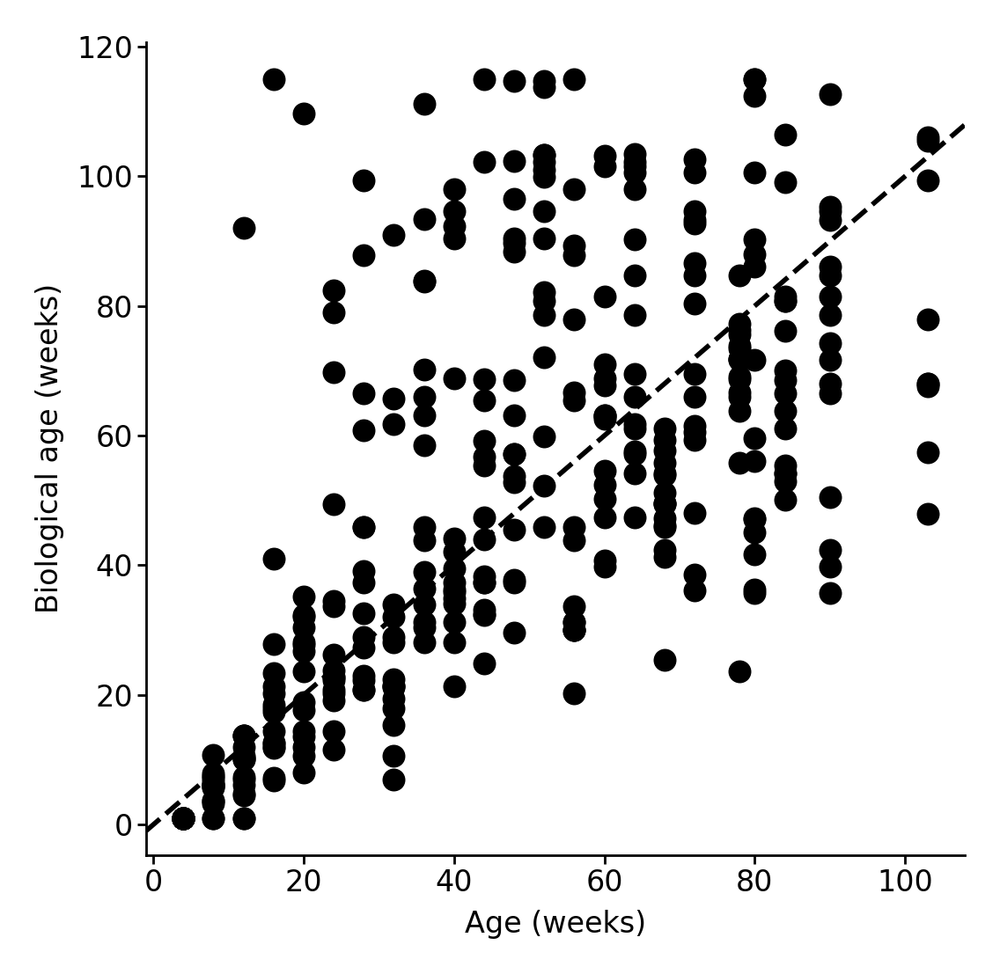

In [12]:
plt.scatter(tmp[0]['true_ages'], tmp[0]['bio_ages'], s=15, c='k')
plt.xlabel('Age (weeks)')
plt.ylabel("Biological age (weeks)")
add_identity(plt.gca(), c='k', ls='--', lw=1)
sns.despine()

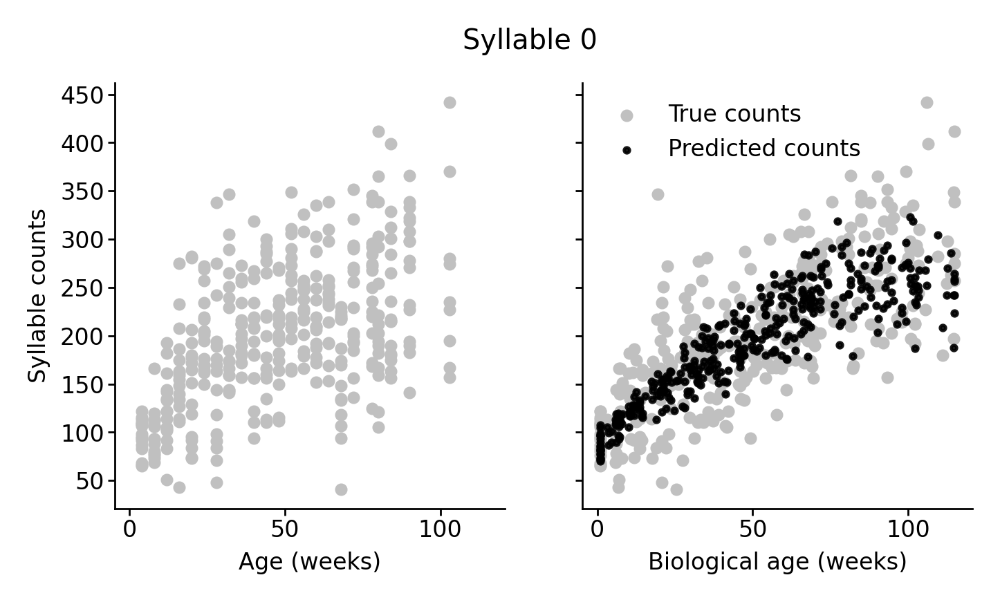

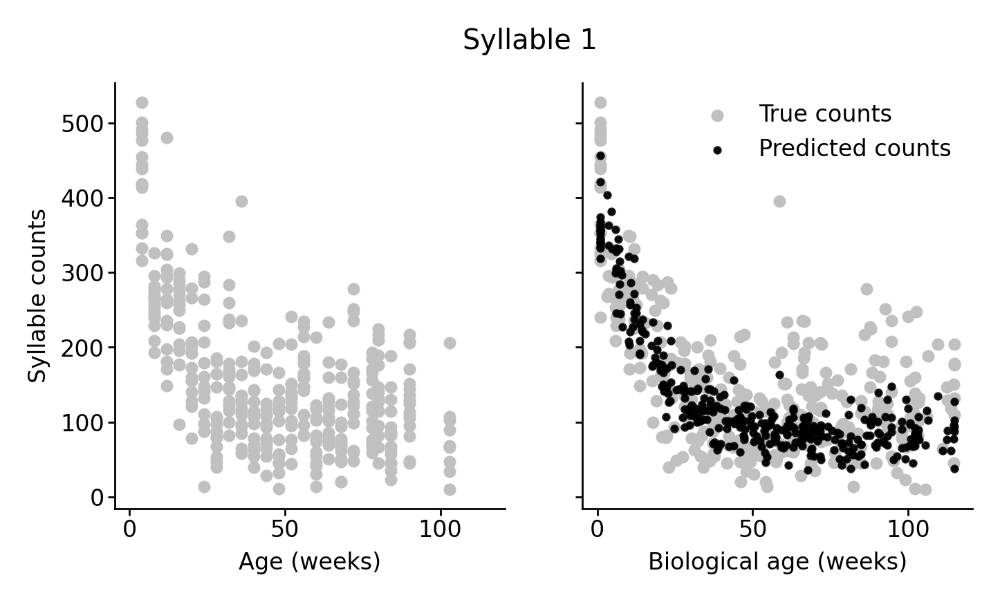

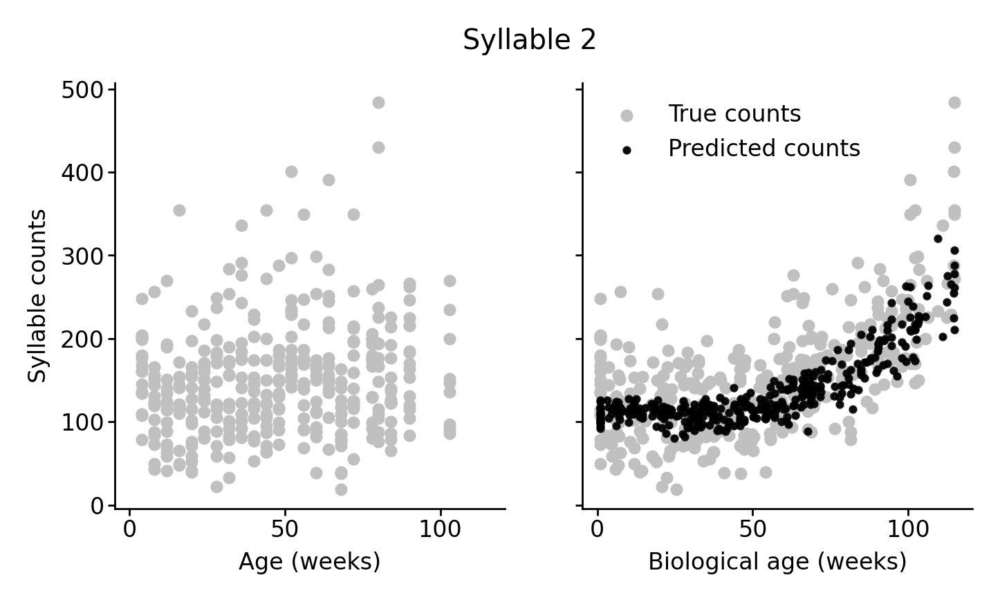

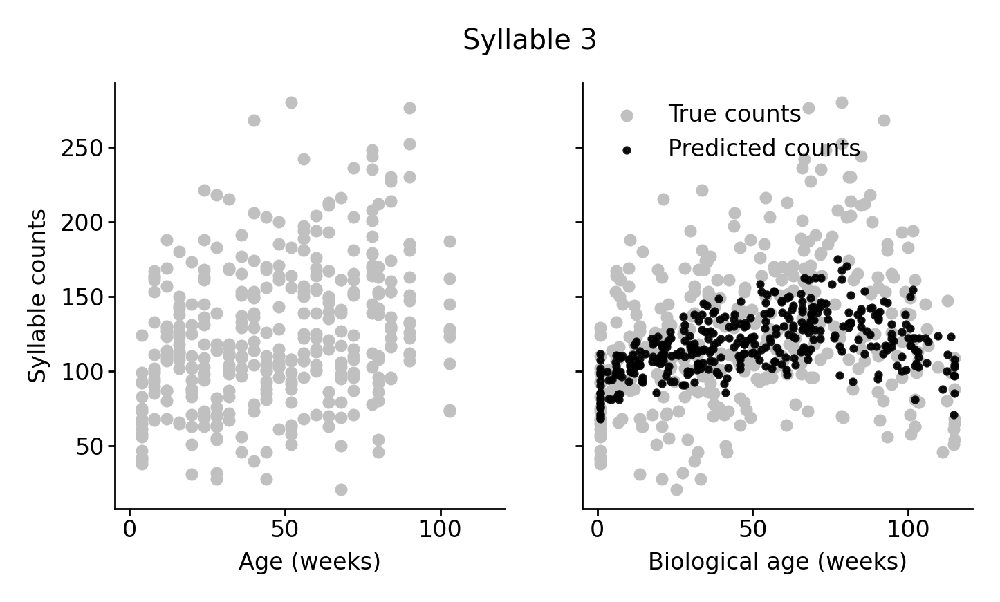

In [13]:
for syllable in range(4):
    to_plt = tmp[0]
    comp = to_plt["init_components"]
    plt_df = pd.DataFrame(
        dict(
            age=to_plt["true_ages"],
            bio_age=to_plt["bio_ages"],
            pred_counts=to_plt["predicted_counts"][:, syllable],
            counts=to_plt["counts"][:, syllable],
        )
    )

    fig, ax = plt.subplots(1, 2, figsize=(4, 2), sharey=True, sharex=True)

    ax[0].scatter(plt_df["age"], plt_df["counts"], c="silver", s=6)
    ax[1].scatter(plt_df["bio_age"], plt_df["counts"], c="silver", s=6, label="True counts")
    ax[1].scatter(plt_df["bio_age"], plt_df["pred_counts"], c="k", s=2, alpha=0.9, label="Predicted counts")
    ax[1].set(xlabel="Biological age (weeks)")
    ax[0].set(xlabel="Age (weeks)", ylabel="Syllable counts")
    ax[1].legend(frameon=False)
    sns.despine()
    fig.suptitle(f"Syllable {syllable}")

## Compare model v1 + v2

In [29]:
hypparams["age_sd"] = 26
hypparams["n_splines"] = 4

tmp = masked_xval(features, hypparams, 1, n_repeats=25)
tmp2 = masked_xval(features, hypparams, 2, n_repeats=25)

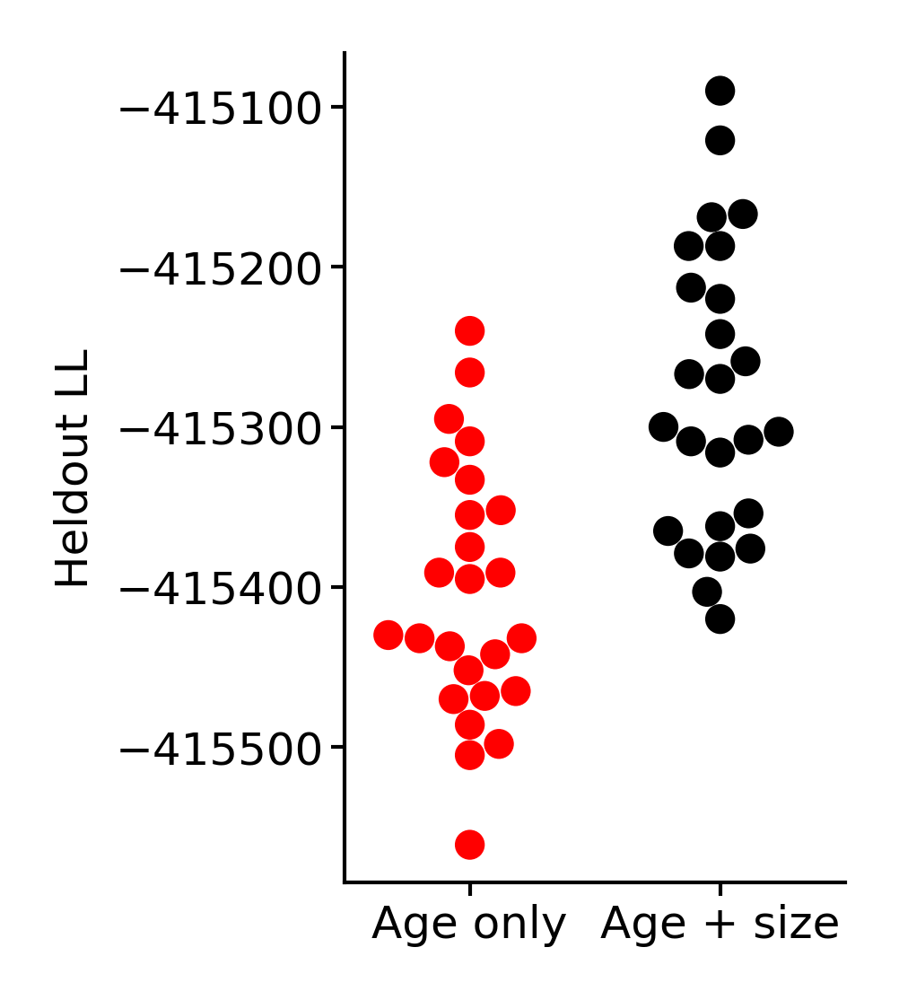

In [33]:
to_plt = [
    list(pluck('heldout_ll', tmp.values())),
    list(pluck('heldout_ll', tmp2.values())),
]
figure(1.2, 2)
ax = sns.swarmplot(data=to_plt, palette=['r', 'k'], size=4)
ax.set(xticks=[0, 1], xticklabels=['Age only', 'Age + size'], ylabel='Heldout LL')
sns.despine()

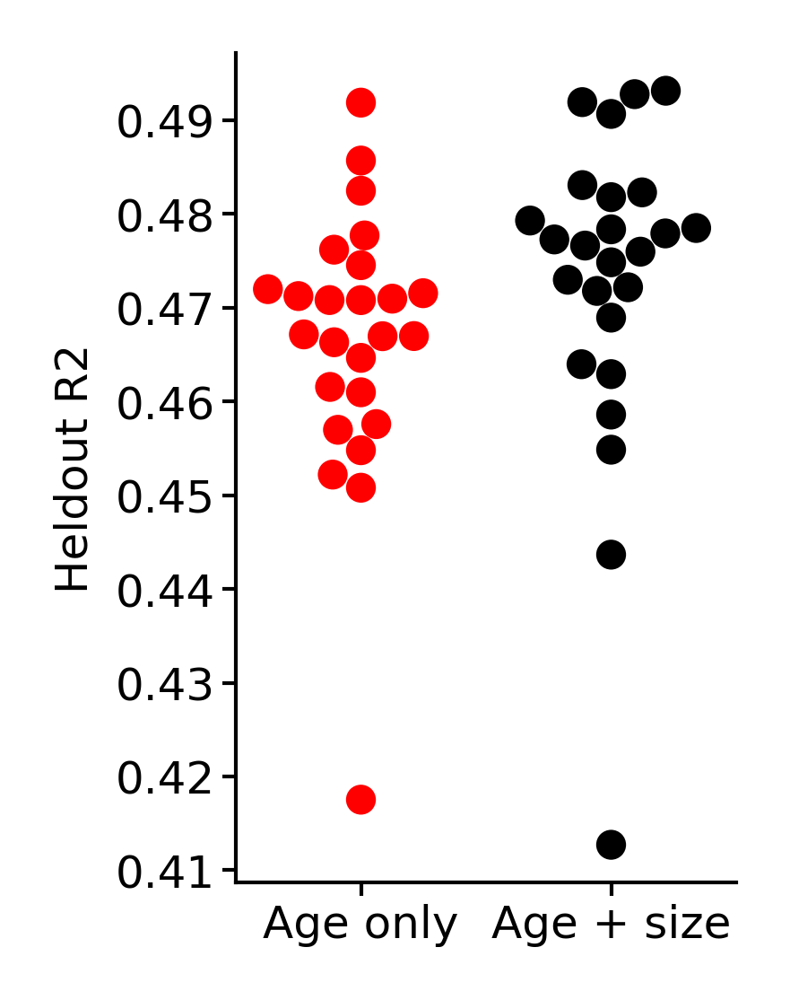

In [32]:
to_plt = [
    list(pluck('heldout_r2_total_v2', tmp.values())),
    list(pluck('heldout_r2_total_v2', tmp2.values())),
]
figure(1.2, 2)
ax = sns.swarmplot(data=to_plt, palette=['r', 'k'], size=4)
ax.set(xticks=[0, 1], xticklabels=['Age only', 'Age + size'], ylabel='Heldout R2')
sns.despine()

## Gridsearch n_splines and age_sd

In [9]:
# do the optimal values change depending on the number of heldout syllables?

outs = []

n_flush_samples = 10

for i, (age_sd, n_splines) in tqdm(
    list(enumerate(product(range(10, 33, 3), range(5, 11, 1))))
):
    hypparams["age_sd"] = age_sd
    hypparams["n_splines"] = n_splines

    tmp = masked_xval(features, hypparams, 1, n_repeats=8)

    for v in tmp.values():
        v["init_components"].age_normalizer = None
        v["init_components"].age_unnormalizer = None

    tmp["grid_params"] = {
        "age_sd": age_sd,
        "n_splines": n_splines,
    }
    # each output is HUGE so need to filter to save only what I care about
    outs.append(tmp)
    if (i + 1) % n_flush_samples == 0:
        joblib.dump(
            outs, save_path / f"model_v1_gridsearch_file-{i // n_flush_samples:02d}.p"
        )
        outs = []
joblib.dump(
    outs, save_path / f"model_v1_gridsearch_file-{(i + n_flush_samples) // n_flush_samples:02d}.p"
)
outs = []

  0%|          | 0/48 [00:00<?, ?it/s]

## Add size, run parameter scan

In [64]:
# do the optimal values change depending on the number of heldout syllables?

outs = []

n_flush_samples = 10

for i, (age_sd, n_splines) in tqdm(
    list(enumerate(product(range(10, 33, 3), range(5, 11, 1))))
):
    hypparams["age_sd"] = age_sd
    hypparams["n_splines"] = n_splines

    tmp = masked_xval(features, hypparams, 2, n_repeats=8)

    for v in tmp.values():
        v["init_components"].age_normalizer = None
        v["init_components"].age_unnormalizer = None

    tmp["grid_params"] = {
        "age_sd": age_sd,
        "n_splines": n_splines,
    }
    # each output is HUGE so need to filter to save only what I care about
    outs.append(tmp)
    if (i + 1) % n_flush_samples == 0:
        joblib.dump(
            outs, save_path / f"model_v2_gridsearch_file-{i // n_flush_samples:02d}.p"
        )
        outs = []
joblib.dump(
    outs, save_path / f"model_v2_gridsearch_file-{(i + n_flush_samples) // n_flush_samples:02d}.p"
)
outs = []

  0%|          | 0/48 [00:00<?, ?it/s]

#### Test new model type

In [8]:
hypparams["age_sd"] = 25
hypparams["n_splines"] = 5
hypparams["n_size_splines"] = 5

out = masked_xval(features, hypparams, 2, n_repeats=1)

In [9]:
list(out[0])

['params',
 'heldout_ll',
 'loss',
 'bio_ages',
 'true_ages',
 'init_components',
 'concentrations',
 'concentration_components',
 'predicted_counts',
 'counts',
 'r2_total',
 'r2_each',
 'heldout_r2_total_v2',
 'heldout_r2_total']

In [15]:
out[0]['heldout_ll']

-413385

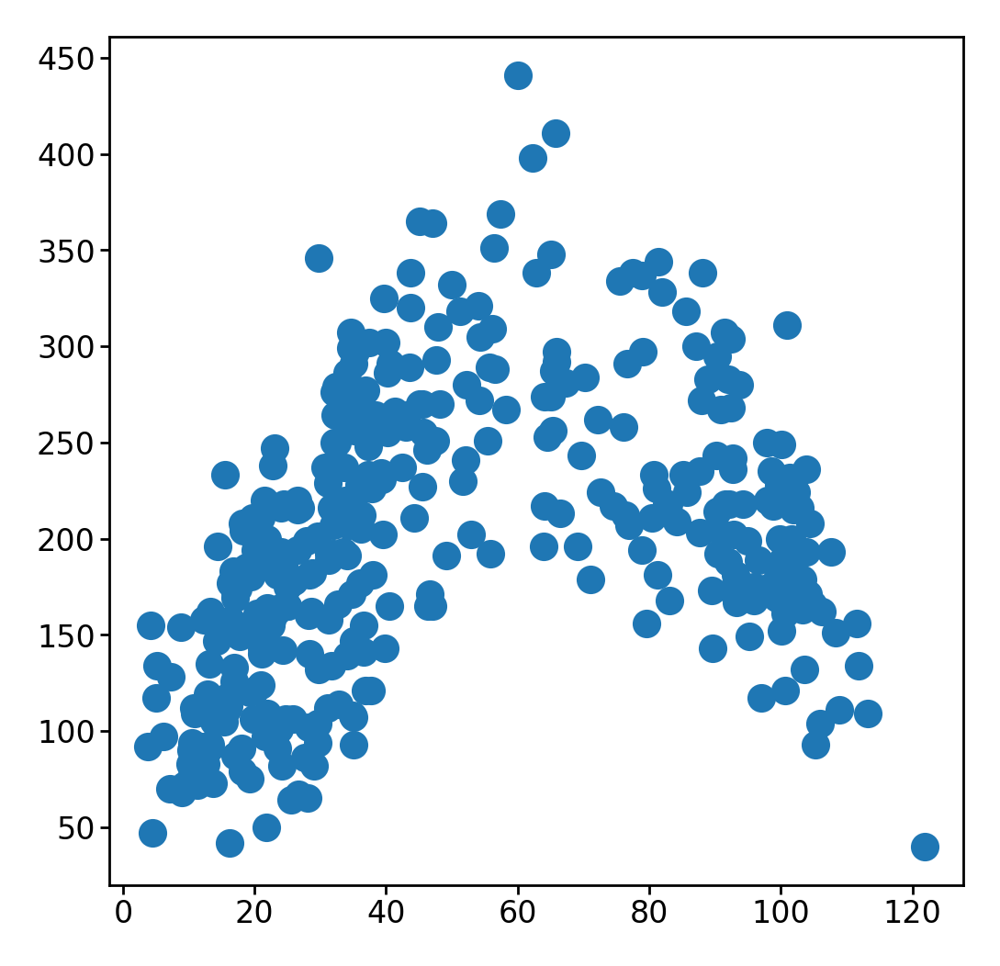

In [10]:
plt.scatter(out[0]['bio_ages'], syllable_counts_jax[:, 0])

<Axes: >

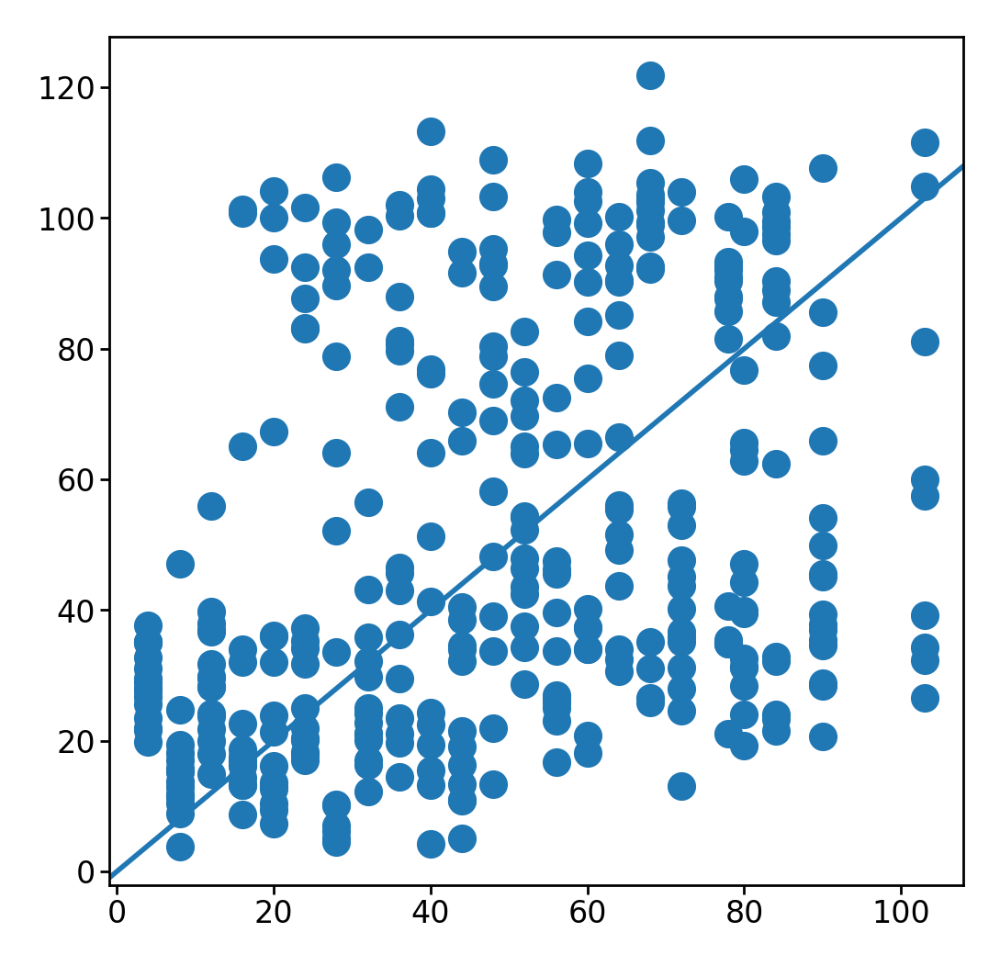

In [11]:
plt.scatter(out[0]['true_ages'], out[0]['bio_ages'])
add_identity(plt.gca())

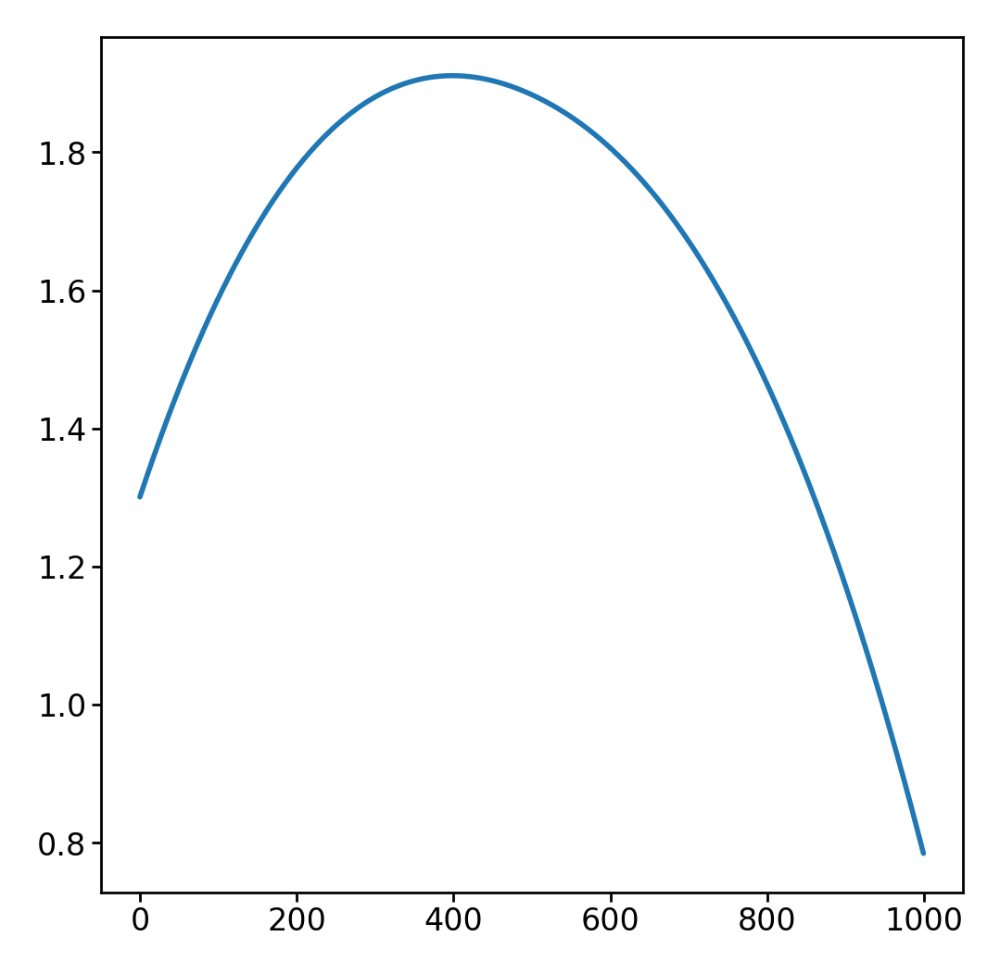

In [12]:
plt.plot(out[0]['concentration_components']['bio'][0])

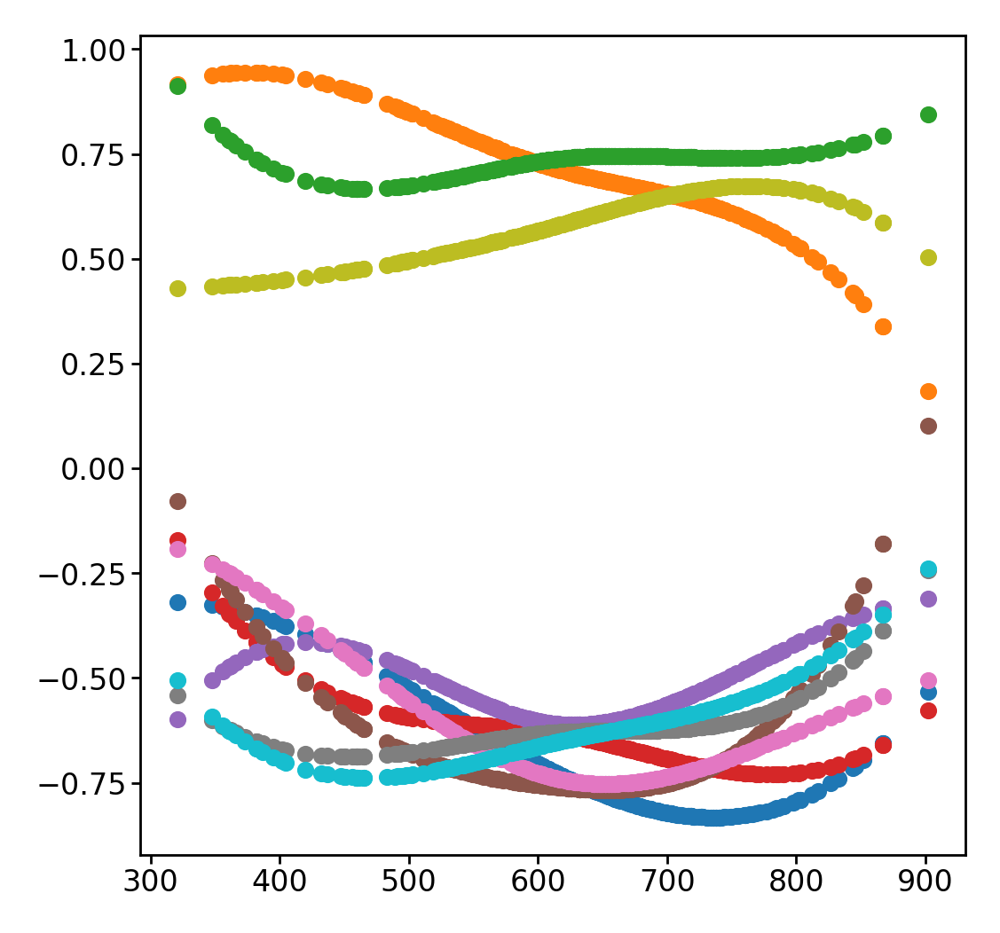

In [13]:
for i in range(10):
    plt.scatter(sizes_col, out[0]['concentration_components']['size'][i], s=7)

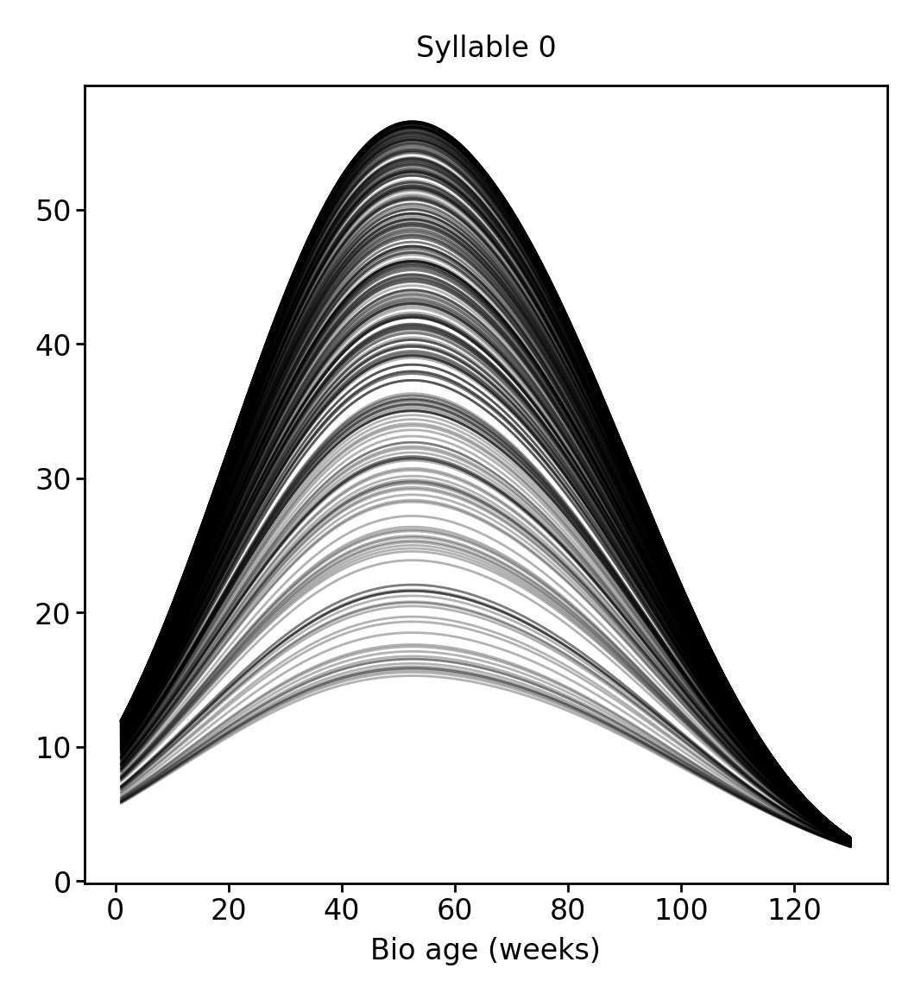

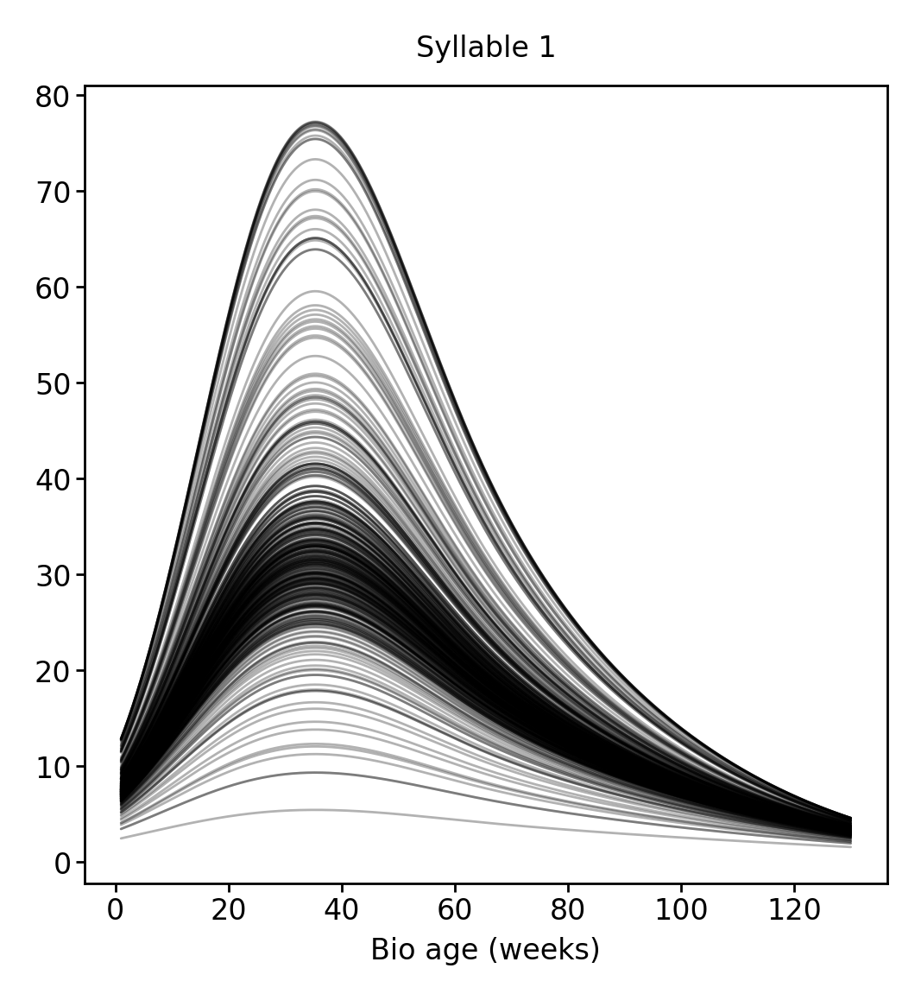

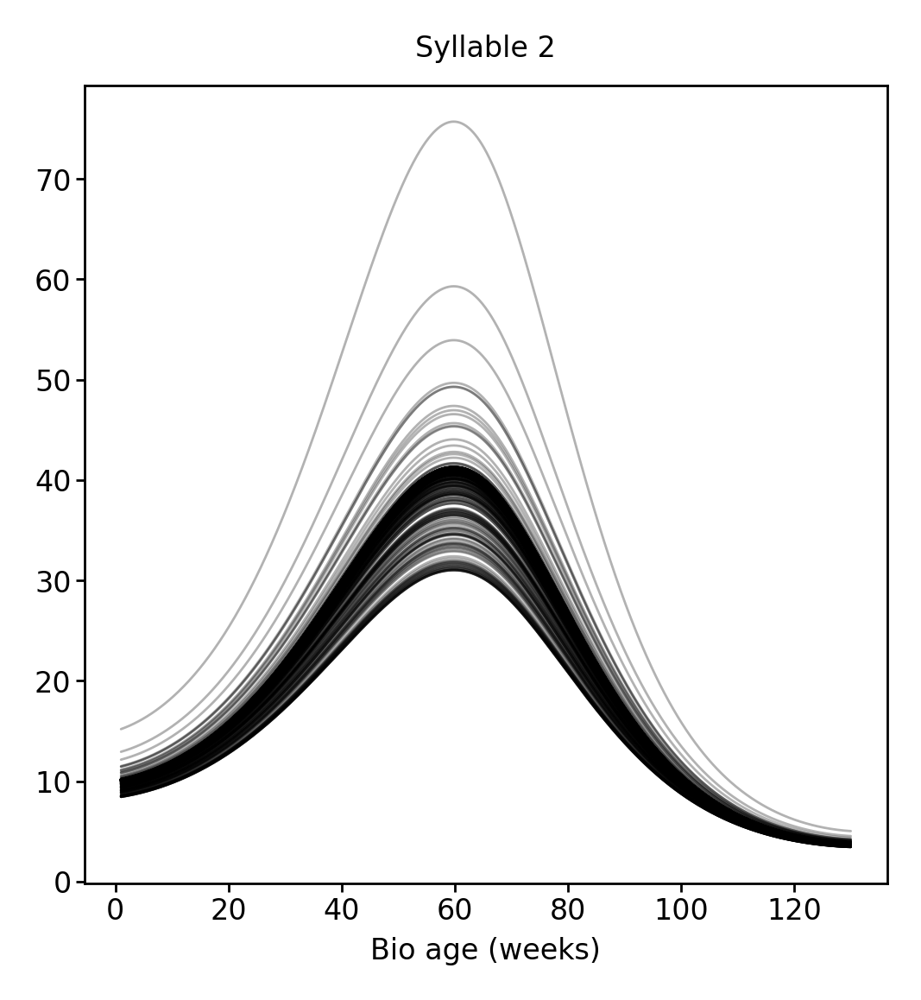

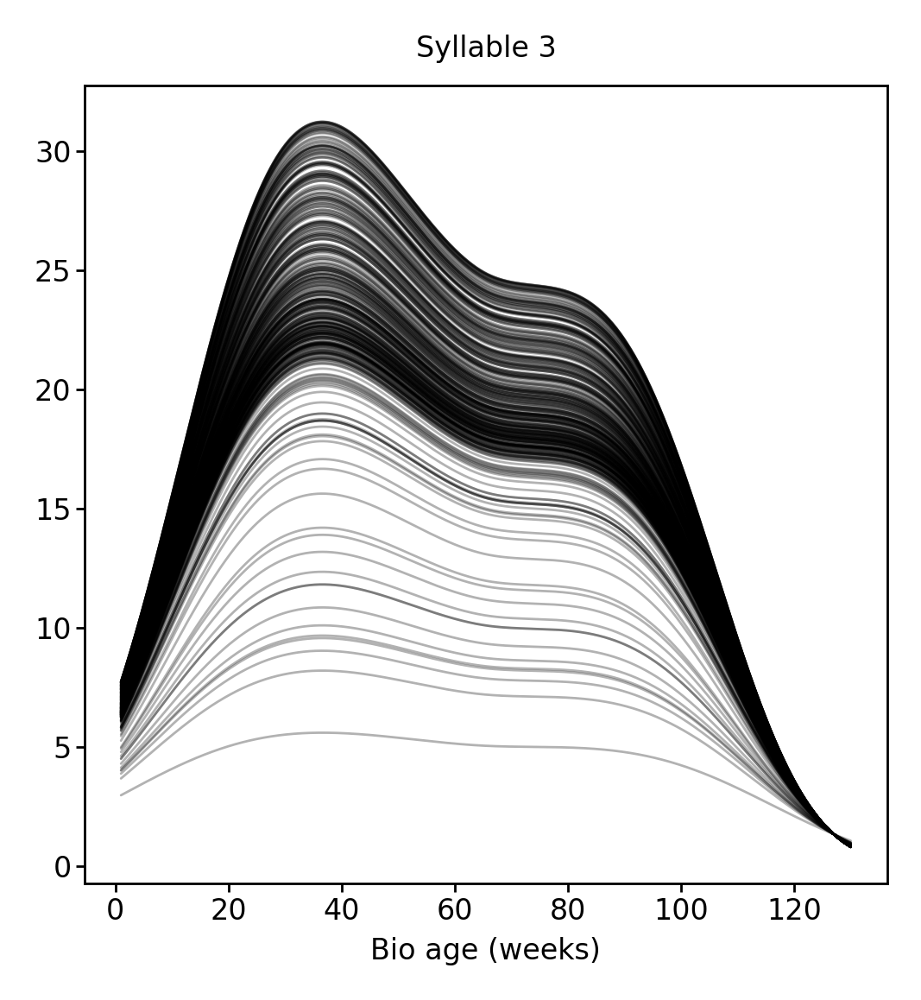

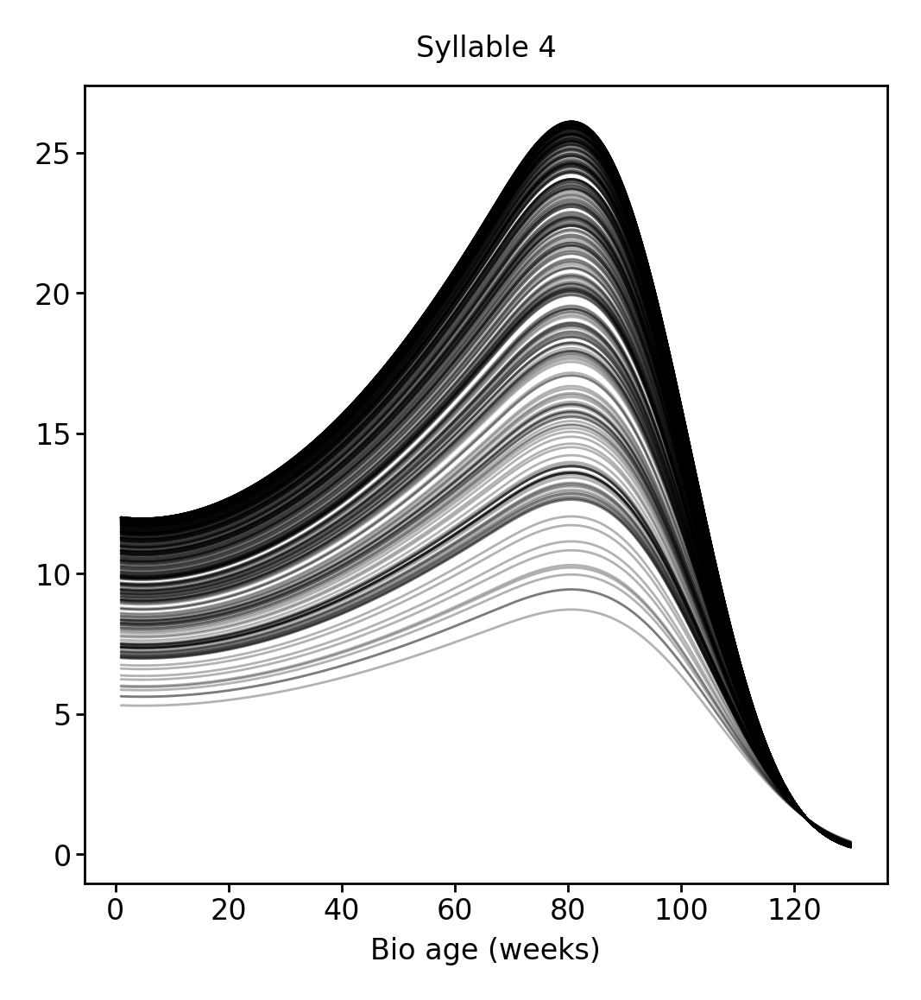

...

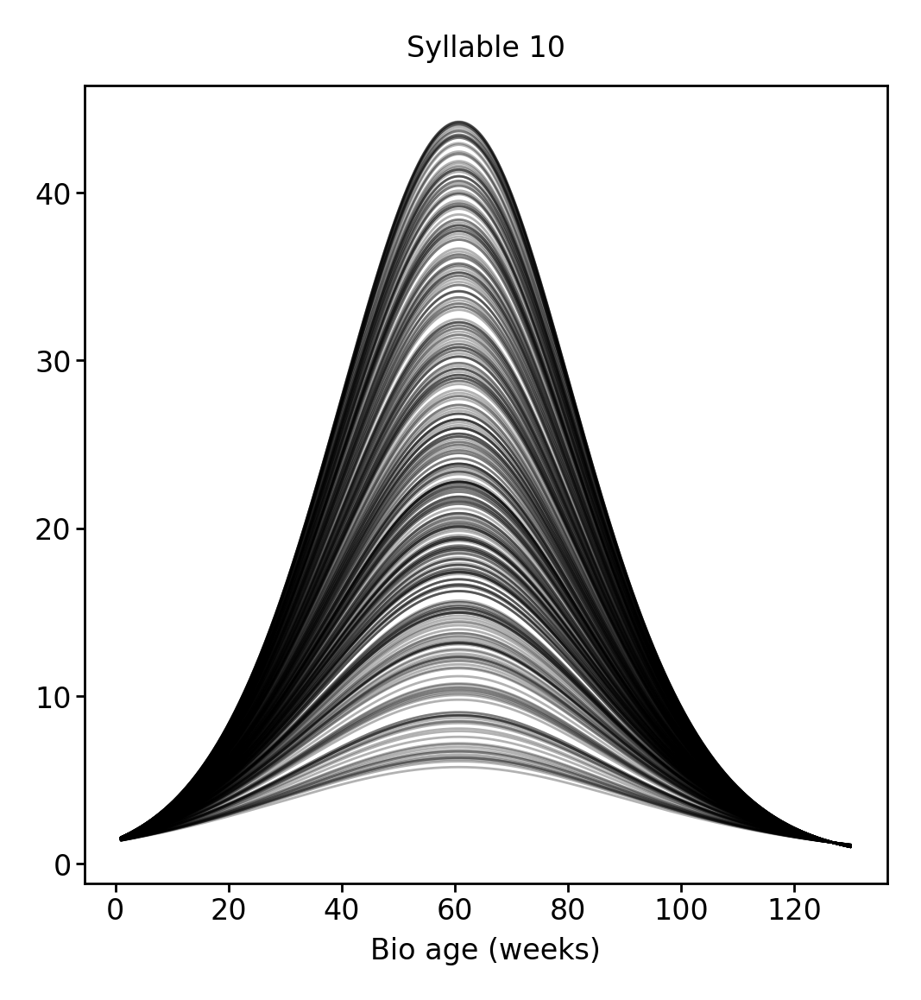

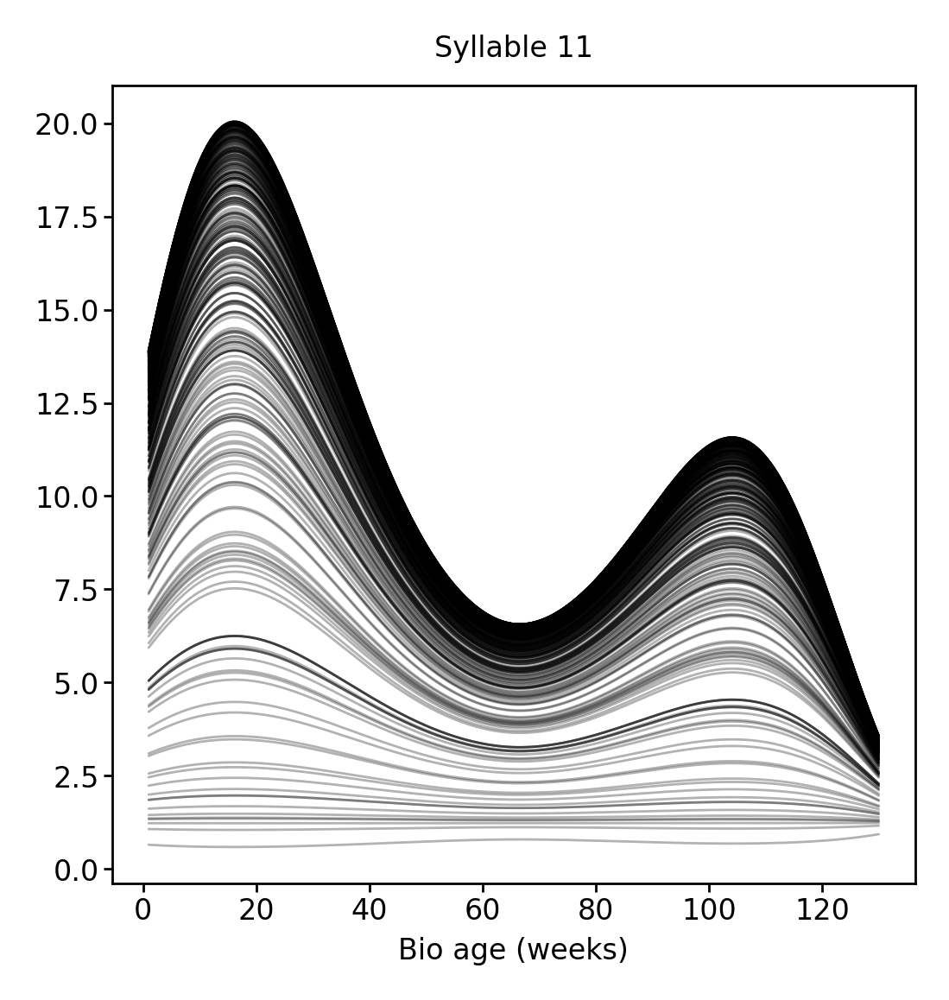

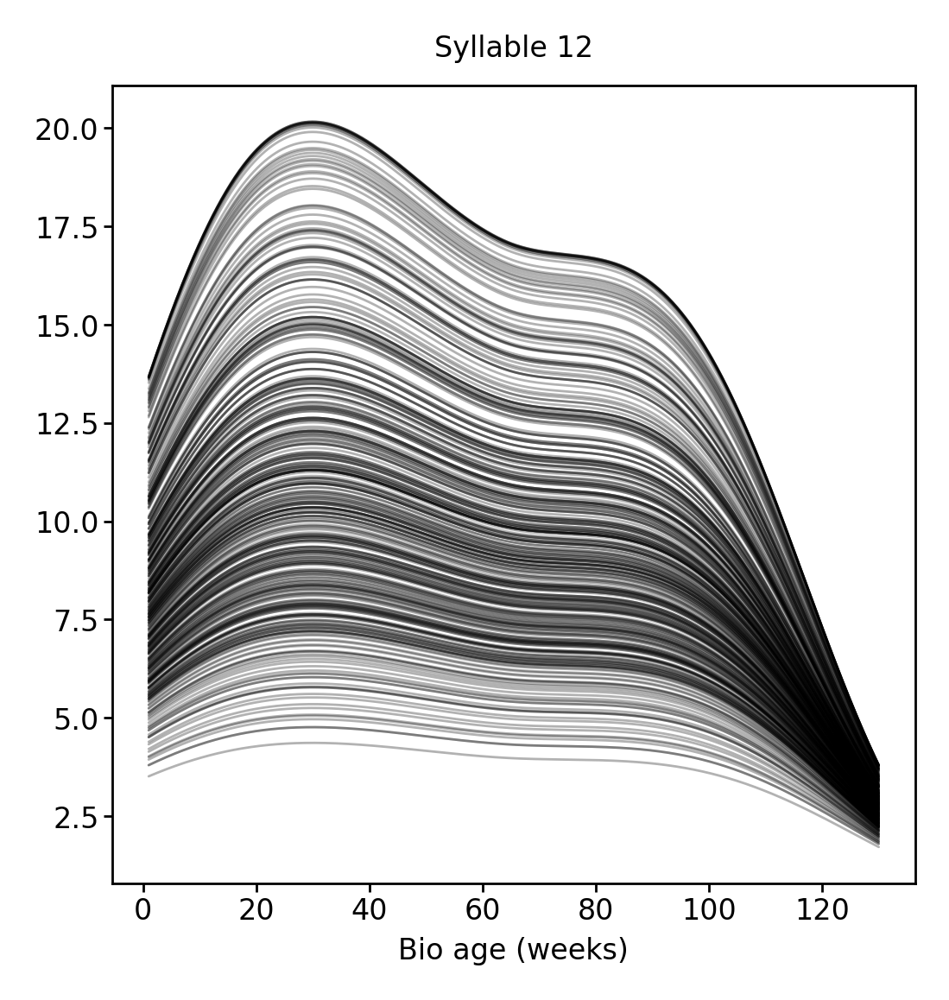

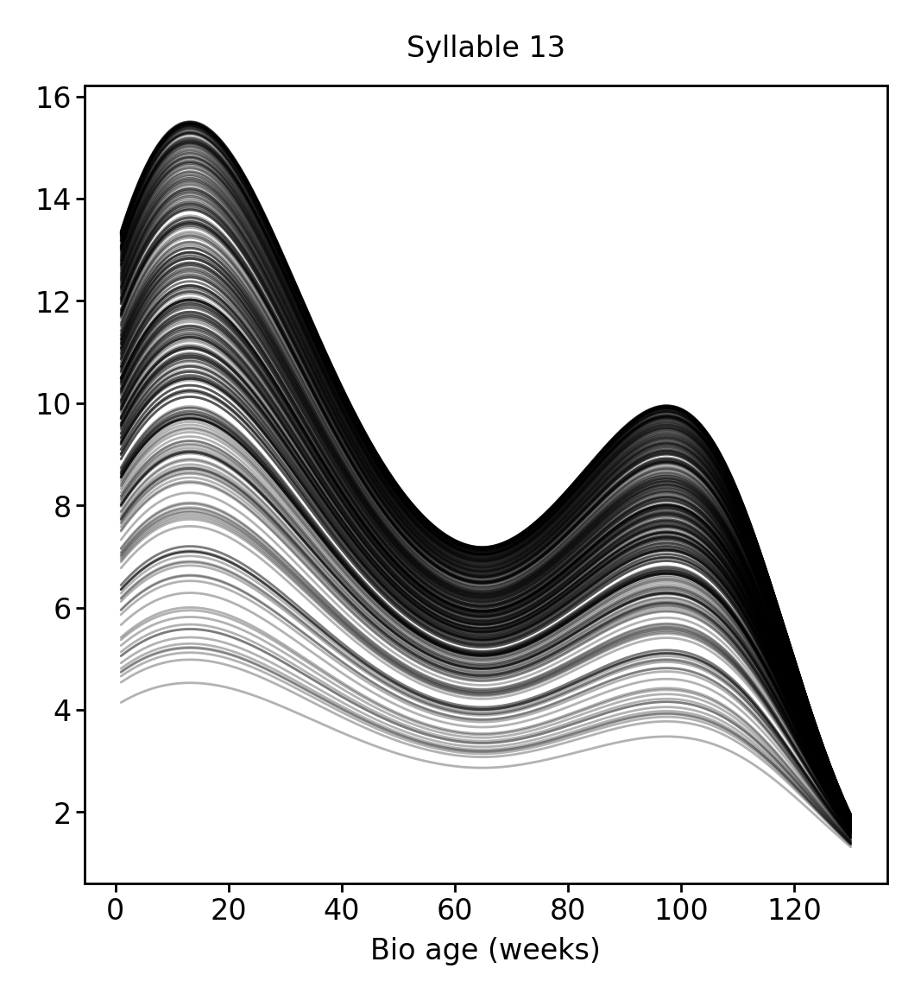

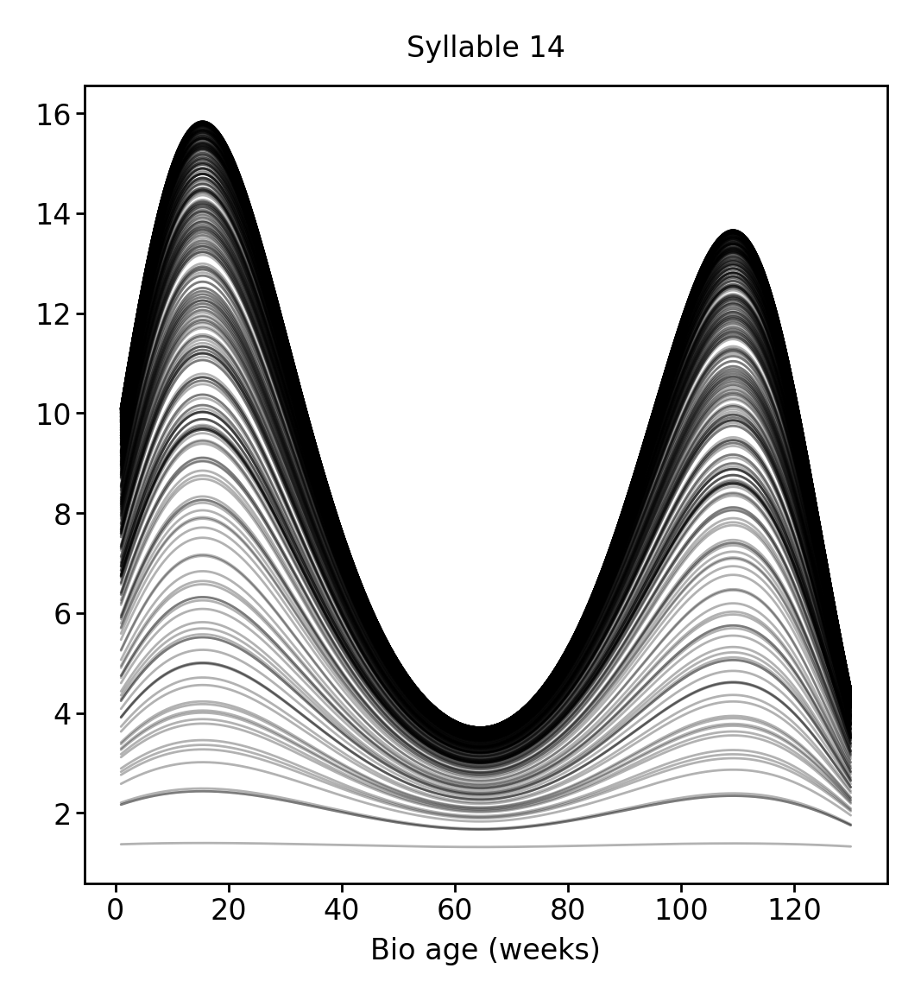

In [16]:
for syllable in range(15):
    plt.figure()
    for i in range(len(out[0]['concentrations'])):
        plt.plot(np.linspace(1, 130, 1000), out[0]['concentrations'][i, :, syllable], lw=0.5, c='k', alpha=0.3)
    plt.xlabel("Bio age (weeks)")
    plt.title(f"Syllable {syllable}")

# Longtogeny

In [6]:
df = pd.read_parquet(
    # "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_relabeled_counts_matrix_v00.parquet"
    "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_relabeled_counts_matrix_v00.parquet"
)
df = df.sort_index(axis=1)
mask = df.index.get_level_values("age") < 100
df = df[mask].copy()

n_syllables = 70
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))[:, :n_syllables]

size_df = pd.read_parquet(
    # '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_v2_males_mouse_area_df_v00.parquet'
    '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_mouse_area_df_v00.parquet'
)

age_cut = pd.cut(size_df.index.get_level_values('age'), 19)
size_df.loc[size_df['quant_0.5'] == 0, 'quant_0.5'] = np.nan
sizes_col = zscore(size_df.groupby(age_cut, observed=True)['quant_0.5'].transform(demean))
sizes_col = sizes_col.fillna(0)
sizes_col = sizes_col.loc[df.index]

# sizes_col = sizes_col.groupby('mouse').apply(lambda df: df.sort_index(level='age').interpolate()).droplevel(0)
# sizes_col = sizes_col.loc[df.index]

label_encoder = OneHotEncoder(sparse_output=False, dtype=np.float32)
mouse_ids = label_encoder.fit_transform(
    sizes_col.index.get_level_values("mouse").to_numpy()[:, None]
).T

In [7]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": 25,  # weeks
    "bio_params_sd": 0.5,
    "size_params_sd": 0.3,
    "n_age_samples": 1000,
    "n_splines": 5,
    "n_size_splines": 5,
    "n_development_splines": 5,
    "n_syllables": n_syllables,
    "n_keep_sylls": 30,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 500,
}

## Optimize splines using masked cross-validation

In [76]:
outs = []

for n_splines in tqdm(range(4, 16)):

    hypparams["n_splines"] = n_splines

    tmp = masked_xval(features, hypparams, 3, n_repeats=5)
    tmp = valmap(lambda v: keyfilter(lambda k: k in keep_keys, v), tmp)
    for k, v in tmp.items():
        outs.append({
            "repeat": k,
            "n_splines": n_splines,
            **v
        })
outs_df = pd.DataFrame(outs)

  0%|          | 0/12 [00:00<?, ?it/s]

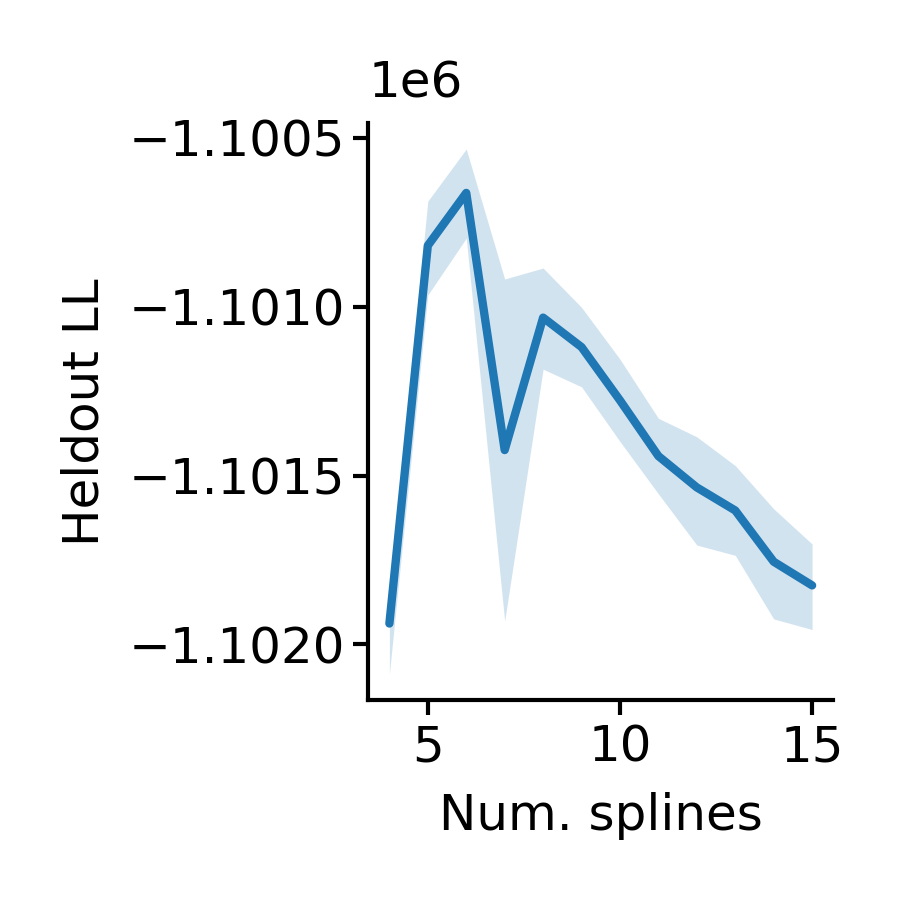

In [77]:
figure(1, 1.25)
ax = sns.lineplot(data=outs_df, x='n_splines', y='heldout_ll', err_kws=dict(lw=0))
ax.set(ylabel="Heldout LL", xlabel="Num. splines")
sns.despine()

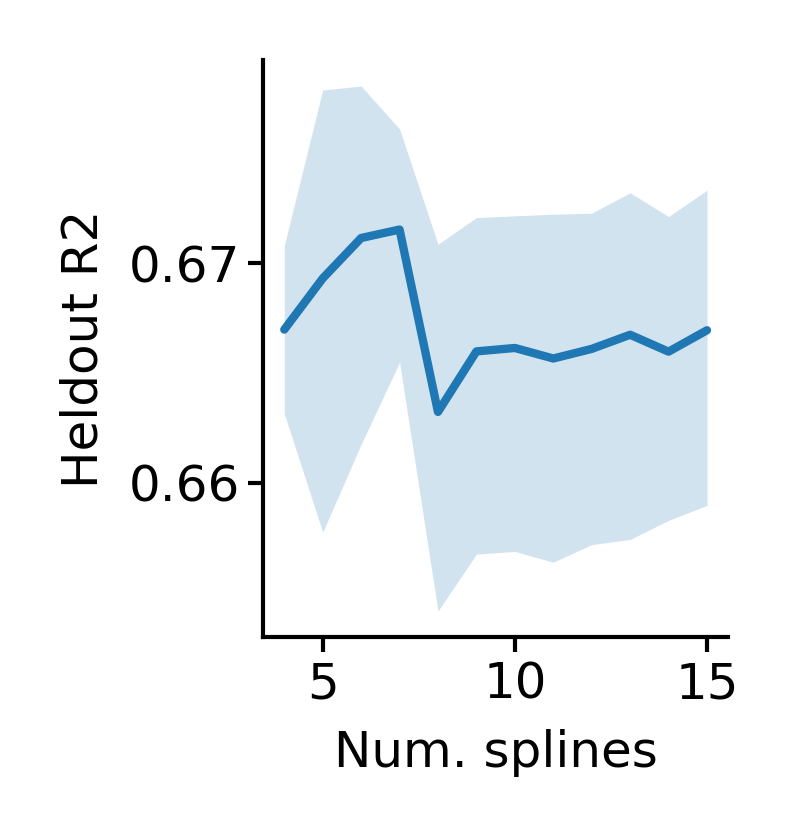

In [78]:
figure(1, 1.25)
ax = sns.lineplot(data=outs_df, x='n_splines', y='heldout_r2_total_v2', err_kws=dict(lw=0))
ax.set(ylabel="Heldout R2", xlabel="Num. splines")
sns.despine()

In [79]:
outs = []
hypparams["n_splines"] = 5

for age_sd in tqdm(np.linspace(1, 50, 12)):

    hypparams["age_sd"] = float(age_sd)

    tmp = masked_xval(features, hypparams, 3, n_repeats=5)
    tmp = valmap(lambda v: keyfilter(lambda k: k in keep_keys, v), tmp)
    for k, v in tmp.items():
        outs.append({
            "repeat": k,
            "age_sd": age_sd,
            **v
        })
age_sd_df = pd.DataFrame(outs)

  0%|          | 0/12 [00:00<?, ?it/s]

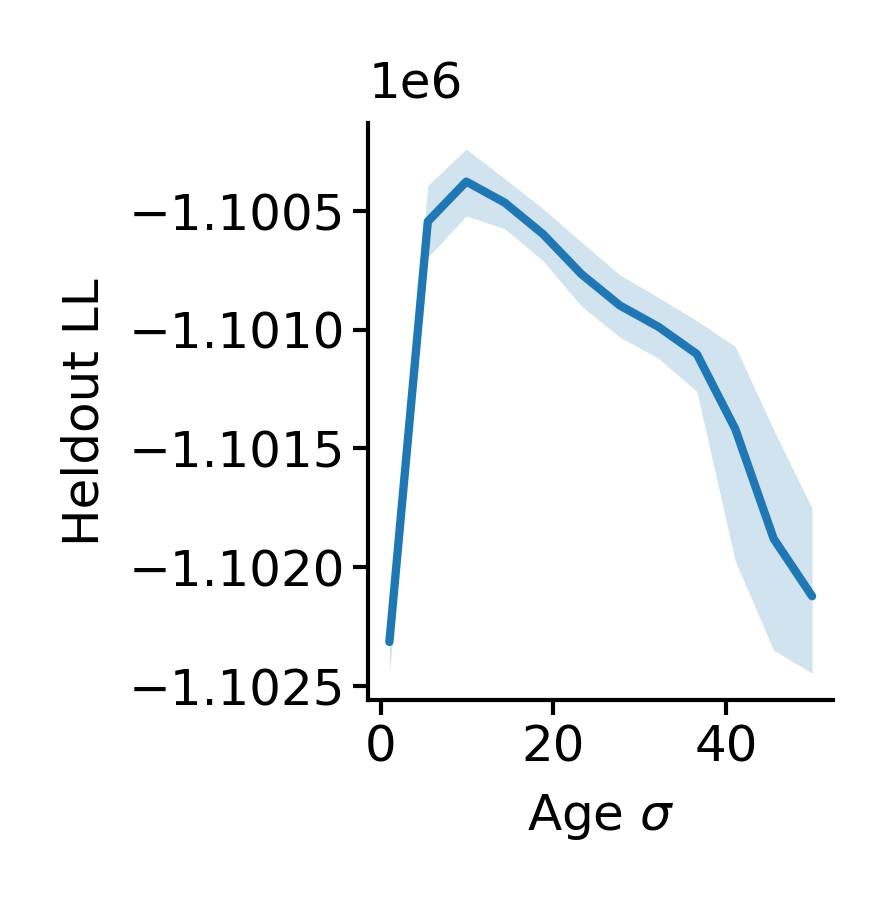

In [80]:
figure(1, 1.25)
ax = sns.lineplot(data=age_sd_df, x='age_sd', y='heldout_ll', err_kws=dict(lw=0))
ax.set(ylabel="Heldout LL", xlabel=r"Age $\sigma$")
sns.despine()

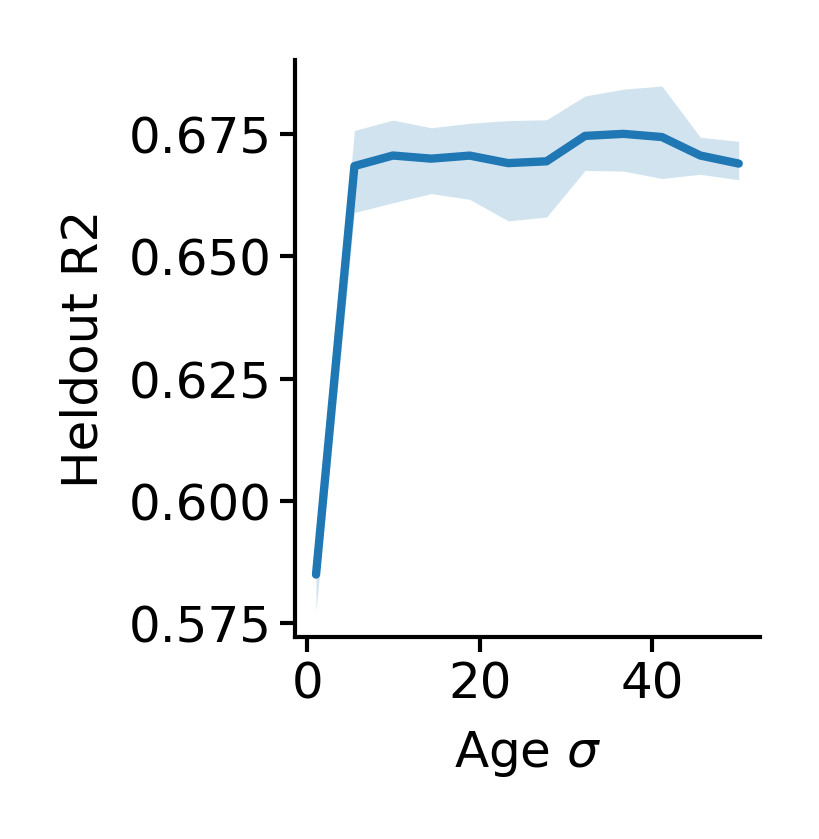

In [81]:
figure(1, 1.25)
ax = sns.lineplot(data=age_sd_df, x='age_sd', y='heldout_r2_total_v2', err_kws=dict(lw=0))
ax.set(ylabel="Heldout R2", xlabel=r"Age $\sigma$")
sns.despine()

In [82]:
hypparams["age_sd"] = 15
hypparams["n_splines"] = 5

tmp = masked_xval(features, hypparams, 1, n_repeats=2)
tmp2 = masked_xval(features, hypparams, 2, n_repeats=2)
tmp3 = masked_xval(features, hypparams, 3, n_repeats=2)

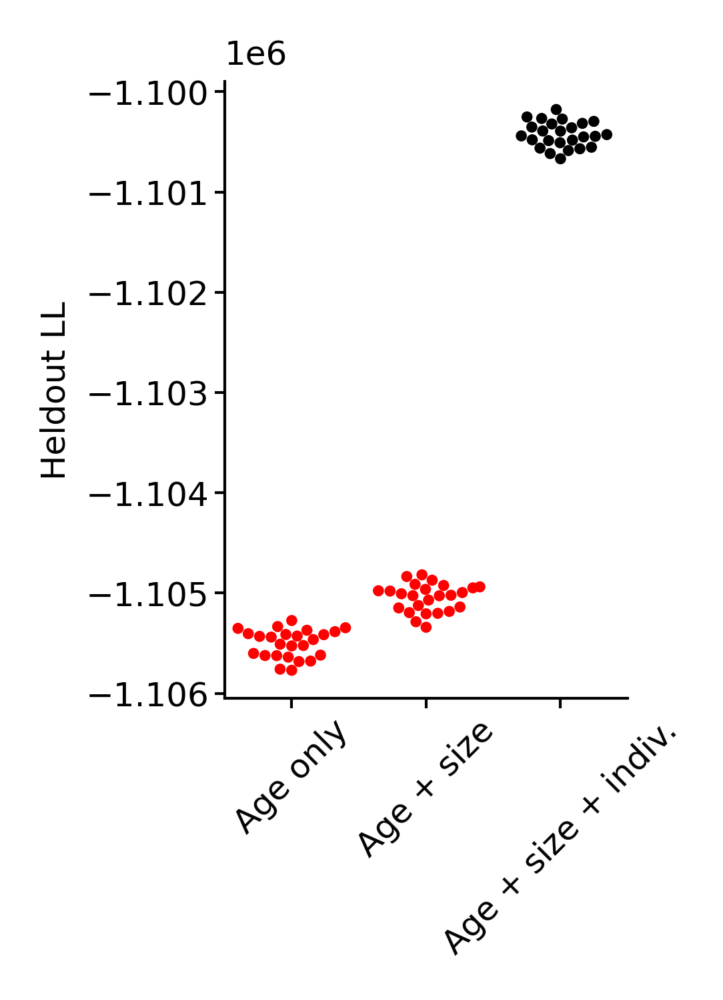

In [21]:
to_plt = [
    list(pluck('heldout_ll', tmp.values())),
    list(pluck('heldout_ll', tmp2.values())),
    list(pluck('heldout_ll', tmp3.values())),
]
figure(1.3, 2)
ax = sns.swarmplot(data=to_plt, palette=['r', 'r', 'k'], size=2)
ax.set(xticks=[0, 1, 2], xticklabels=['Age only', 'Age + size', 'Age + size + indiv.'], ylabel='Heldout LL')
plt.xticks(rotation=45)
sns.despine()

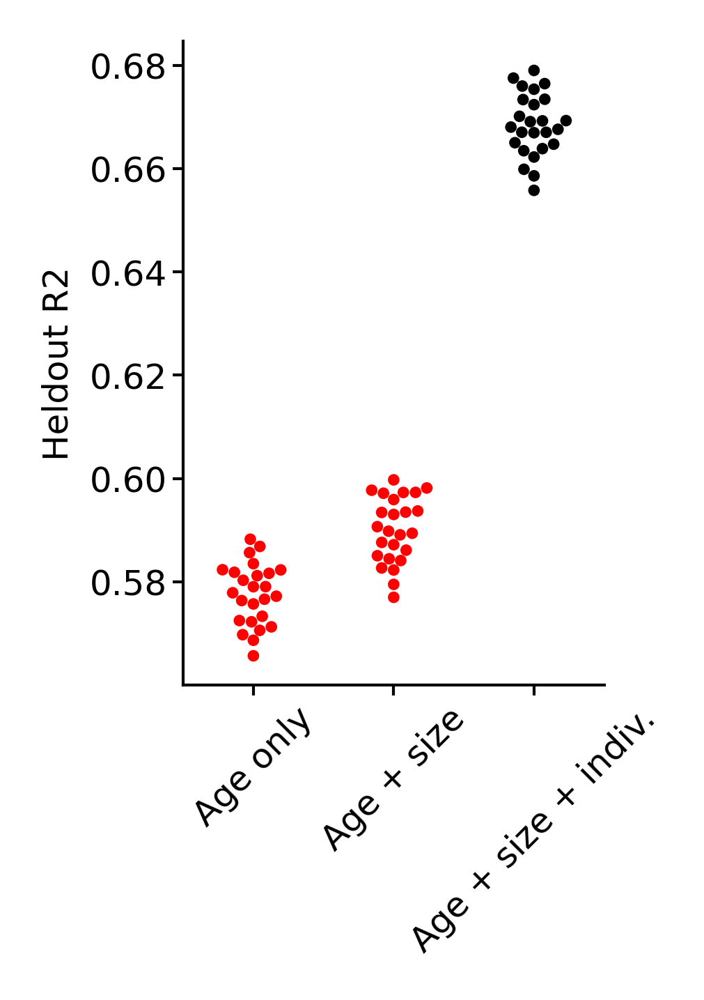

In [22]:
to_plt = [
    list(pluck('heldout_r2_total_v2', tmp.values())),
    list(pluck('heldout_r2_total_v2', tmp2.values())),
    list(pluck('heldout_r2_total_v2', tmp3.values())),
]
figure(1.3, 2)
ax = sns.swarmplot(data=to_plt, palette=['r', 'r', 'k'], size=2)
ax.set(xticks=[0, 1, 2], xticklabels=['Age only', 'Age + size', 'Age + size + indiv.'], ylabel='Heldout R2')
plt.xticks(rotation=45)
sns.despine()

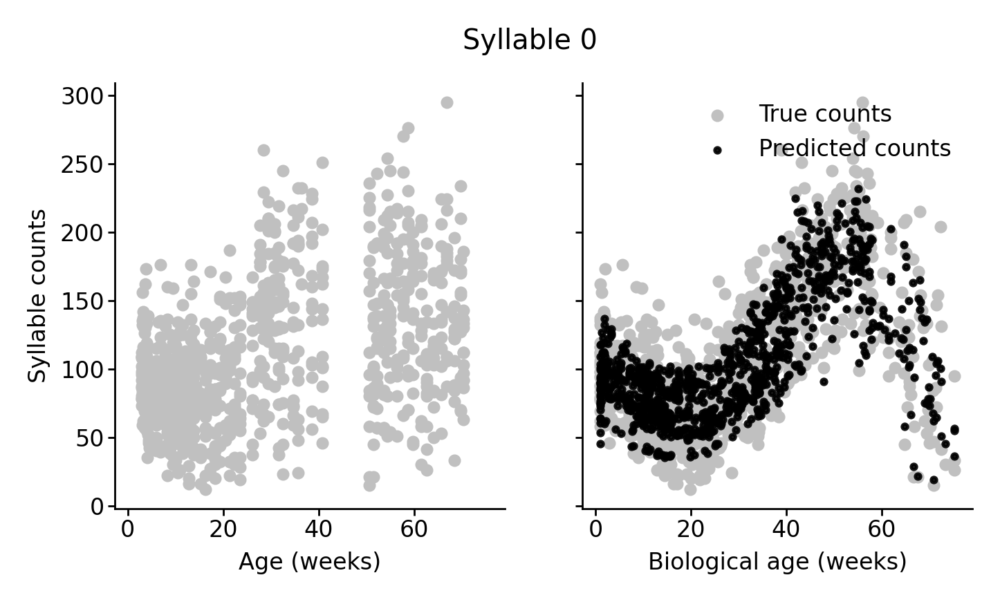

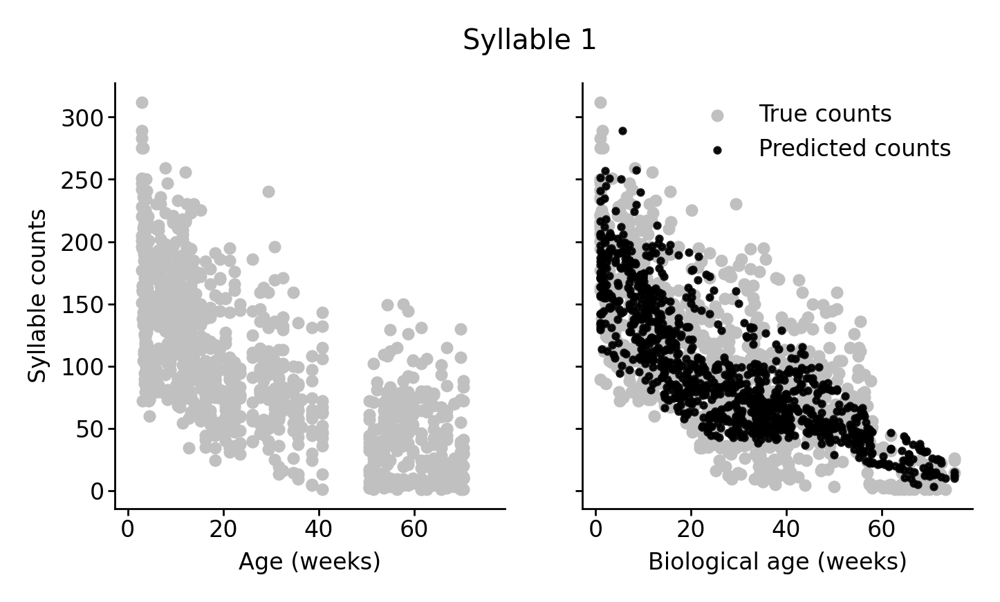

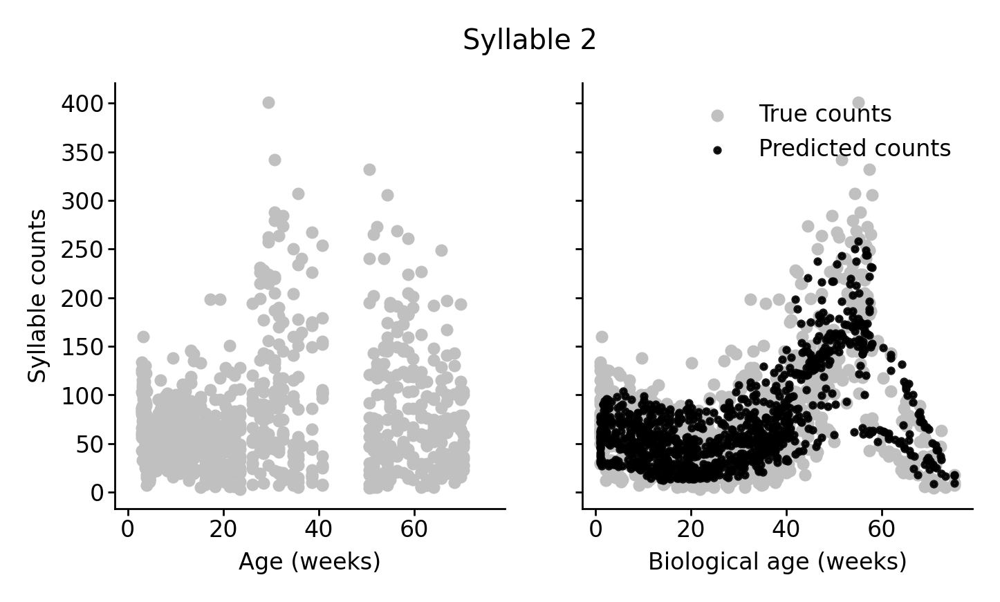

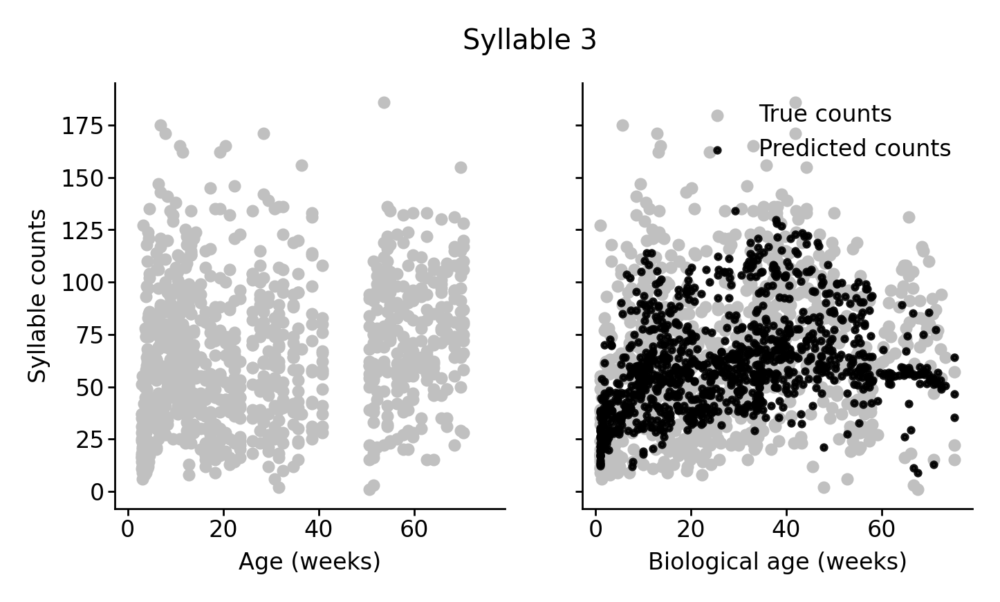

In [83]:
for syllable in range(4):
    to_plt = tmp3[0]
    comp = to_plt["init_components"]
    plt_df = pd.DataFrame(
        dict(
            age=to_plt["true_ages"],
            bio_age=to_plt["bio_ages"],
            pred_counts=to_plt["predicted_counts"][:, syllable],
            counts=to_plt["counts"][:, syllable],
        )
    )

    fig, ax = plt.subplots(1, 2, figsize=(4, 2), sharey=True, sharex=True)

    ax[0].scatter(plt_df["age"], plt_df["counts"], c="silver", s=6)
    ax[1].scatter(plt_df["bio_age"], plt_df["counts"], c="silver", s=6, label="True counts")
    ax[1].scatter(plt_df["bio_age"], plt_df["pred_counts"], c="k", s=2, alpha=0.9, label="Predicted counts")
    ax[1].set(xlabel="Biological age (weeks)")
    ax[0].set(xlabel="Age (weeks)", ylabel="Syllable counts")
    ax[1].legend(frameon=False)
    sns.despine()
    fig.suptitle(f"Syllable {syllable}")

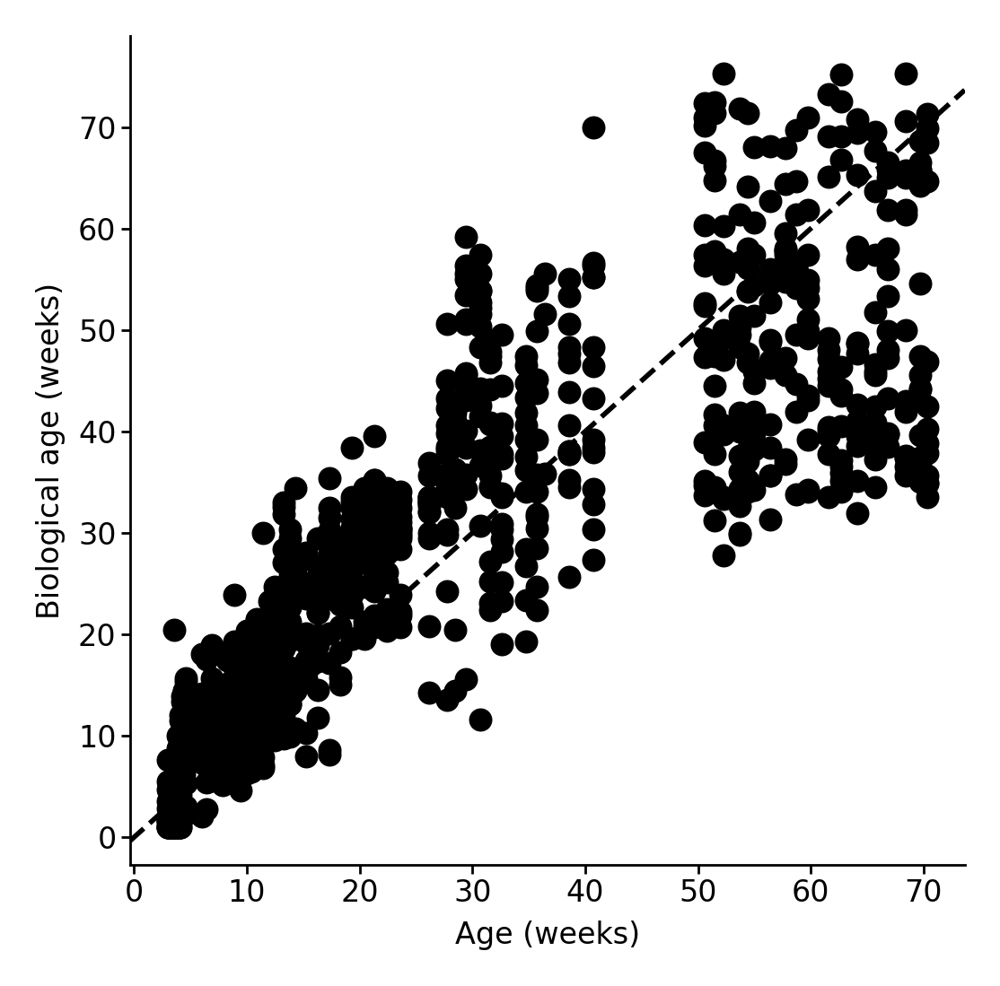

In [84]:
plt.scatter(tmp3[0]['true_ages'], tmp3[0]['bio_ages'], s=15, c='k')
plt.xlabel('Age (weeks)')
plt.ylabel("Biological age (weeks)")
add_identity(plt.gca(), c='k', ls='--', lw=1)
sns.despine()

In [89]:
from aging.behavior.bio_age_model import raise_dim

In [90]:
biases = raise_dim(tmp3[0]['params']['individual_biases'], axis=1)

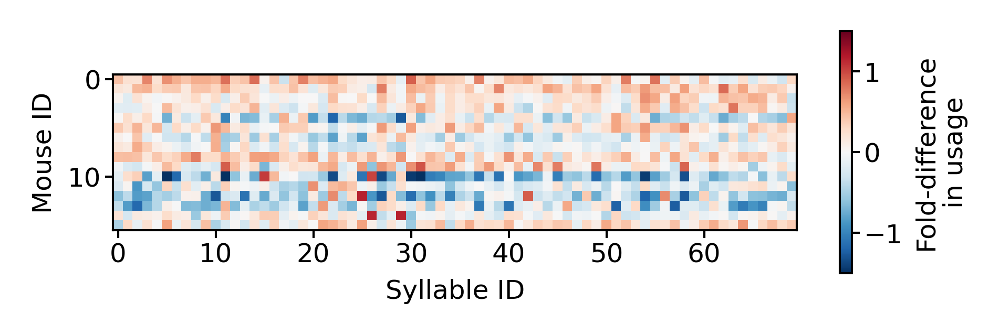

In [106]:
figure(3.5, 1)
plt.imshow(biases.T, cmap="RdBu_r", vmin=-1.5, vmax=1.5)
plt.ylabel("Mouse ID")
plt.xlabel("Syllable ID")
plt.colorbar(label="Fold-difference\nin usage")

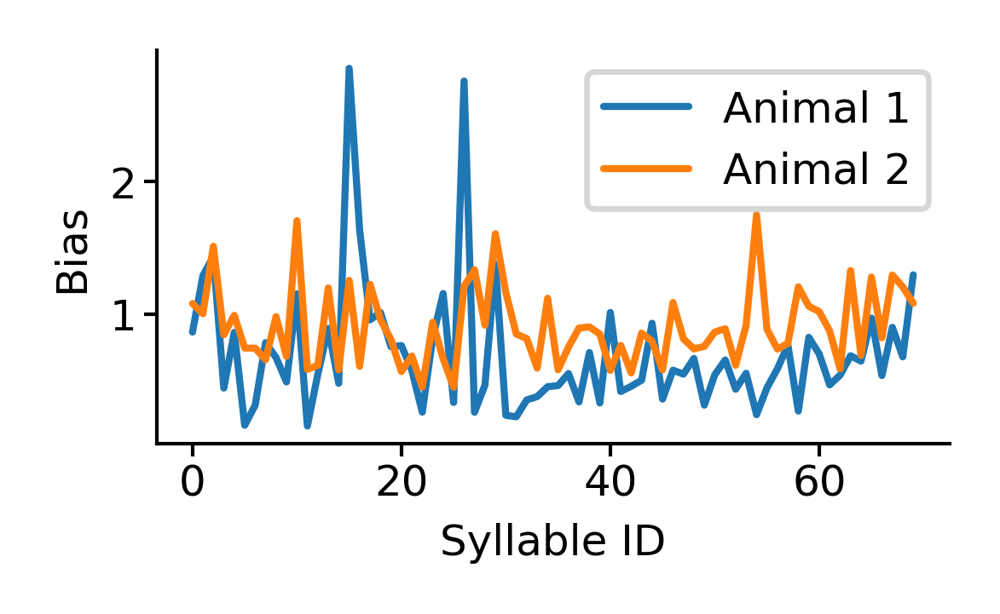

In [108]:
figure(2, 1)
plt.plot(np.exp(biases[:, 10]), label="Animal 1")
plt.plot(np.exp(biases[:, 6]), label="Animal 2")
plt.ylabel('Bias')
plt.xlabel("Syllable ID")
plt.legend()
sns.despine()


In [109]:
mask = df.index.get_level_values("mouse") == "03_03"

In [150]:
data = df.loc[pd.IndexSlice[20:, "03_03"], :].mean().iloc[:70]
data2 = df.loc[pd.IndexSlice[20:, "02_03"], :].mean().iloc[:70]

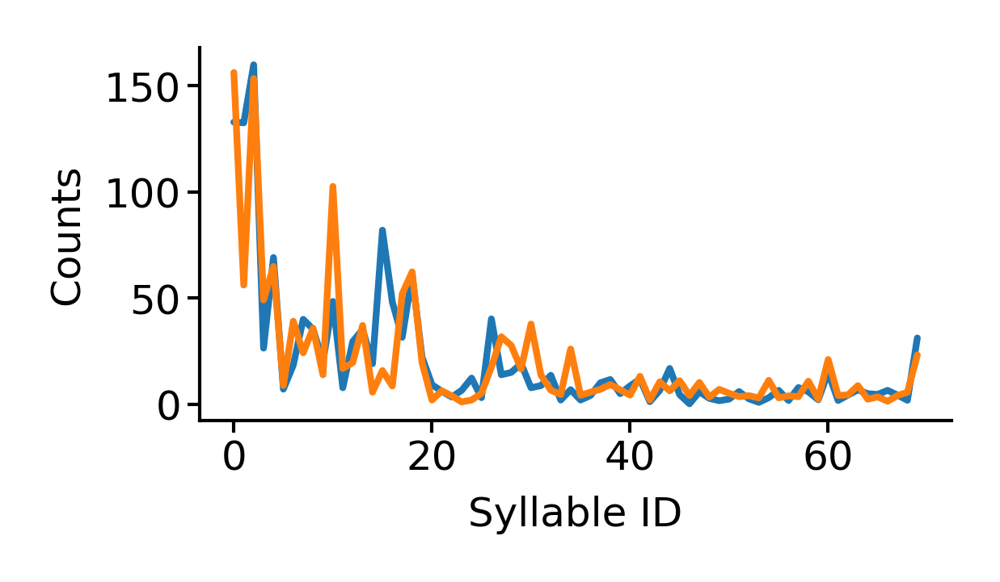

In [152]:
figure(2, 1)
plt.plot(data, label="Animal 1")
plt.plot(data2, label="Animal 2")
plt.ylabel("Counts")
plt.xlabel("Syllable ID")
sns.despine()

0.7069722683929665


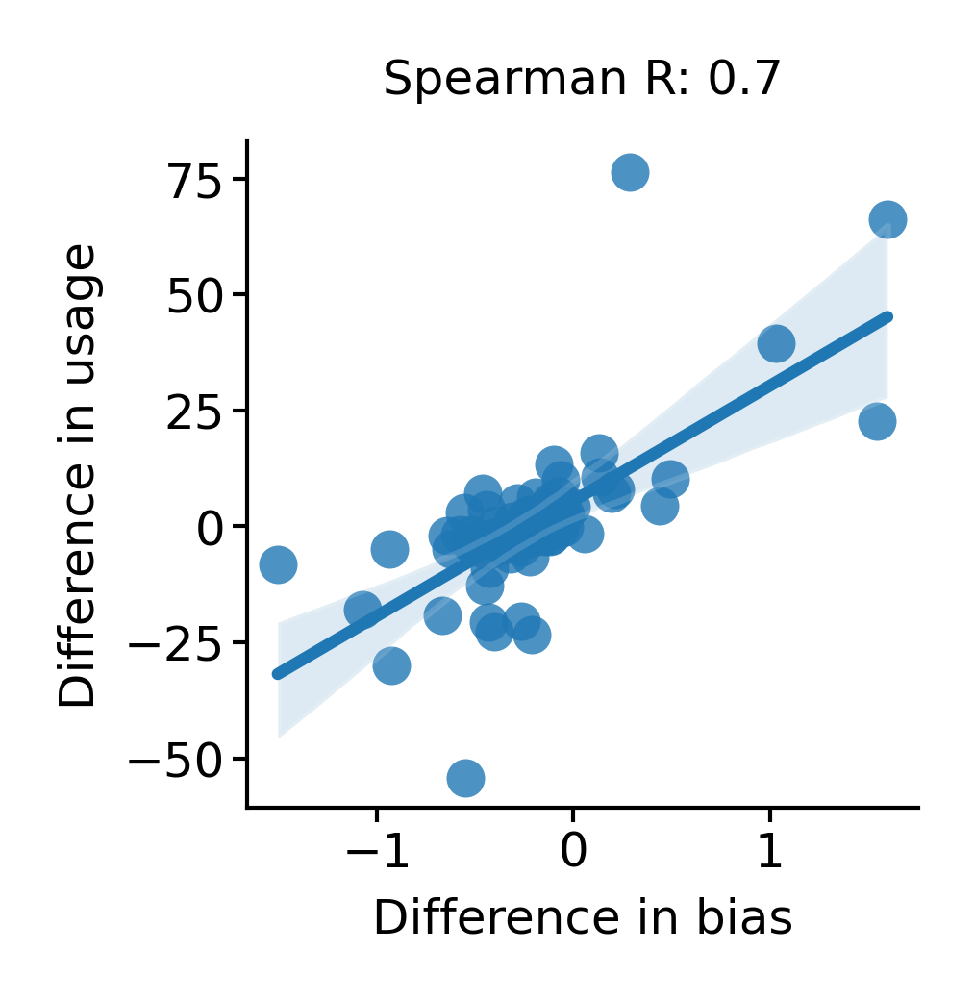

In [149]:
# x = biases[:, 10] - biases[:, 6]
x = np.exp(biases[:, 10]) - np.exp(biases[:, 6])
y = data.iloc[:70] - data2.iloc[:70]
print(pd.Series(x).corr(pd.Series(y.to_numpy()), method='spearman'))

figure(1.5, 1.5)
ax = sns.regplot(
    x=x,
    y=y,
    scatter_kws=dict(linewidths=0),
)
ax.set(ylabel="Difference in usage", xlabel="Difference in bias", title="Spearman R: 0.7")
sns.despine()

## Dynamic individuality

In [70]:
tmp4 = masked_xval(features, hypparams, 4, n_repeats=1)

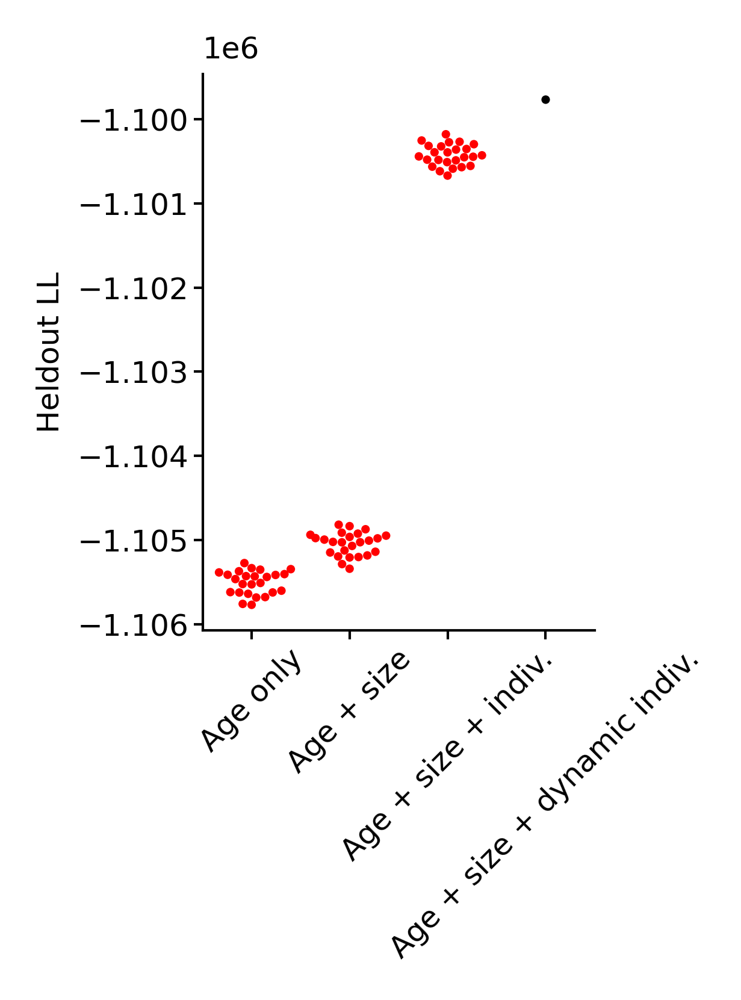

In [71]:
to_plt = [
    list(pluck('heldout_ll', tmp.values())),
    list(pluck('heldout_ll', tmp2.values())),
    list(pluck('heldout_ll', tmp3.values())),
    list(pluck('heldout_ll', tmp4.values())),
]
figure(1.4, 2)
ax = sns.swarmplot(data=to_plt, palette=['r', 'r', 'r', 'k'], size=1.7)
ax.set(xticks=[0, 1, 2, 3], xticklabels=['Age only', 'Age + size', 'Age + size + indiv.', 'Age + size + dynamic indiv.'], ylabel='Heldout LL')
plt.xticks(rotation=45)
sns.despine()

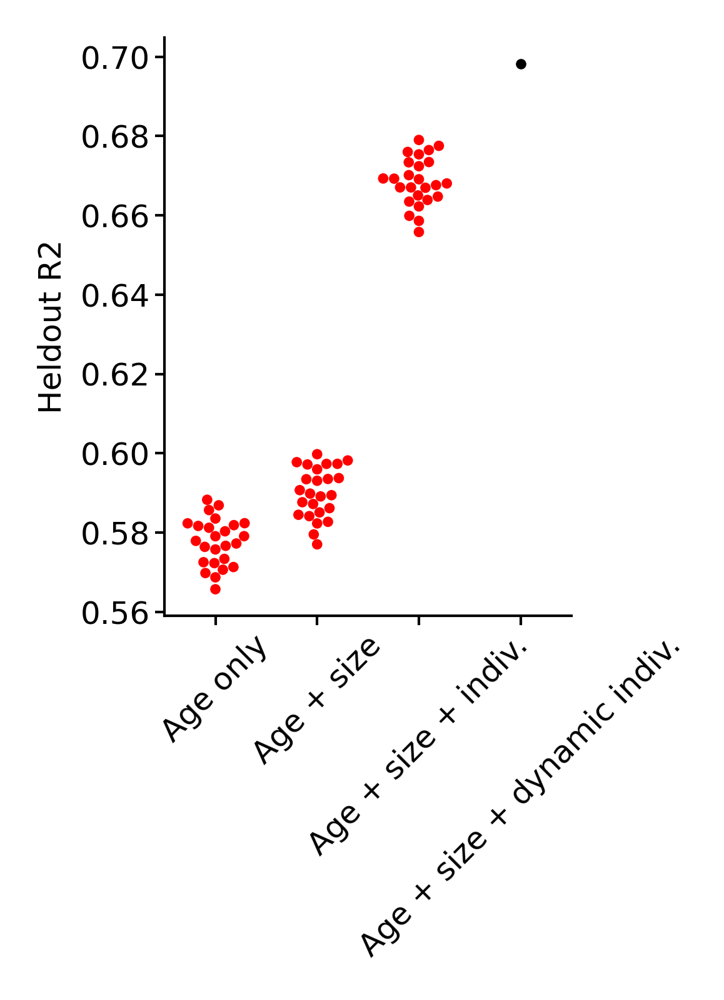

In [72]:
to_plt = [
    list(pluck('heldout_r2_total_v2', tmp.values())),
    list(pluck('heldout_r2_total_v2', tmp2.values())),
    list(pluck('heldout_r2_total_v2', tmp3.values())),
    list(pluck('heldout_r2_total_v2', tmp4.values())),
]
figure(1.4, 2)
ax = sns.swarmplot(data=to_plt, palette=['r', 'r', 'r', 'k'], size=2)
ax.set(xticks=[0, 1, 2, 3], xticklabels=['Age only', 'Age + size', 'Age + size + indiv.', 'Age + size + dynamic indiv.'], ylabel='Heldout R2')
plt.xticks(rotation=45)
sns.despine()

In [73]:
bias_scale = jax.nn.sigmoid(
    (
        tmp4[0]["params"]["development_weights"]
        @ jnp.stack([jnp.linspace(0, 1, 500), jnp.ones(500)])
    ).flatten()
)

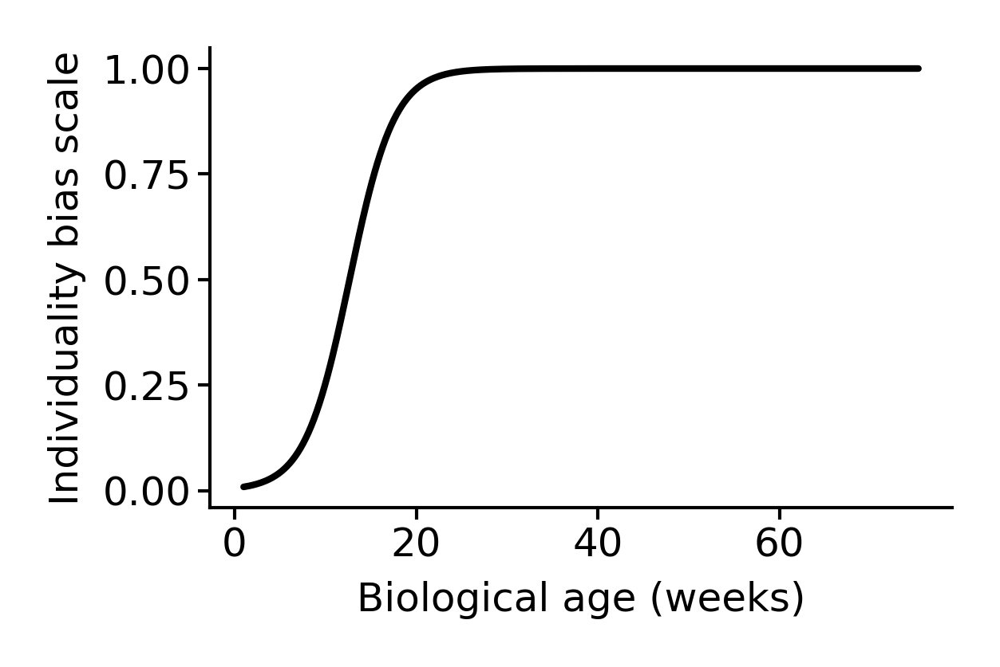

In [74]:
comp = tmp4[0]['init_components']
x = comp.age_unnormalizer(np.linspace(0, 1, 500))

figure(2, 1.25)
plt.plot(x, bias_scale, color='k')
plt.ylabel('Individuality bias scale')
plt.xlabel("Biological age (weeks)")
sns.despine()

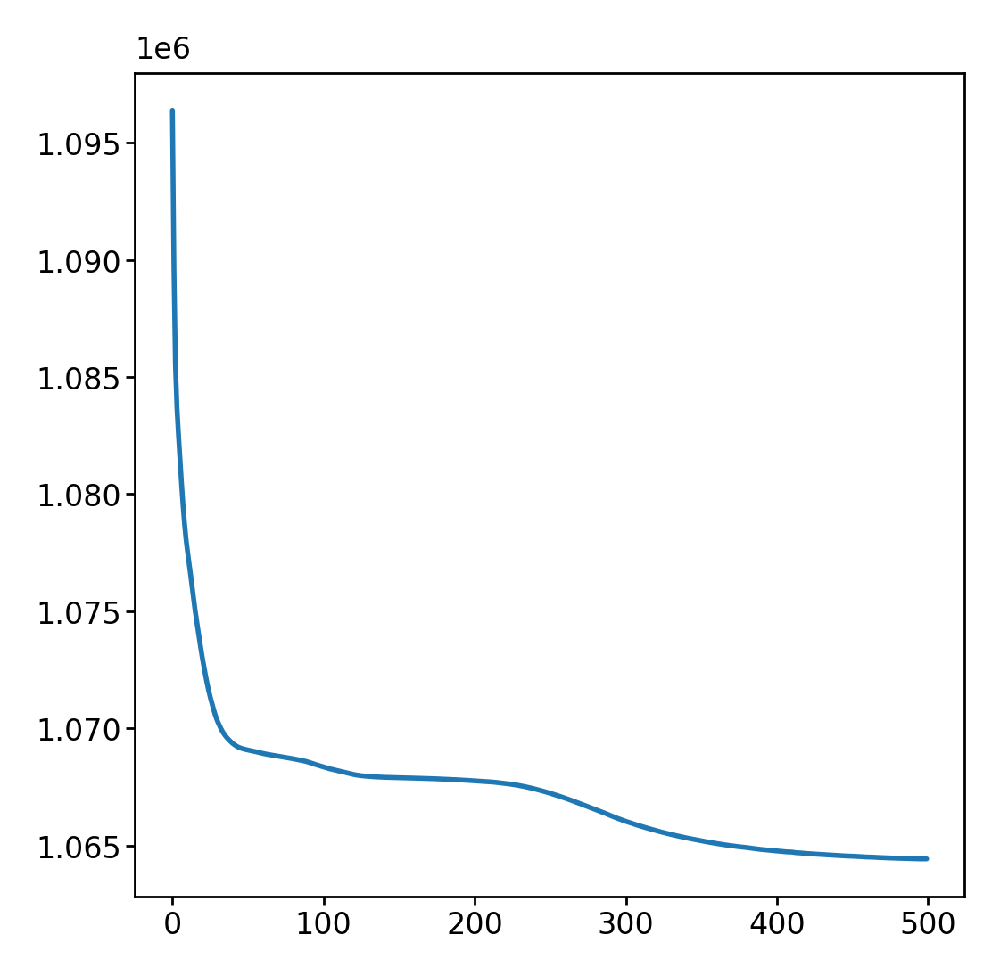

In [75]:
plt.plot(tmp4[0]['loss'])

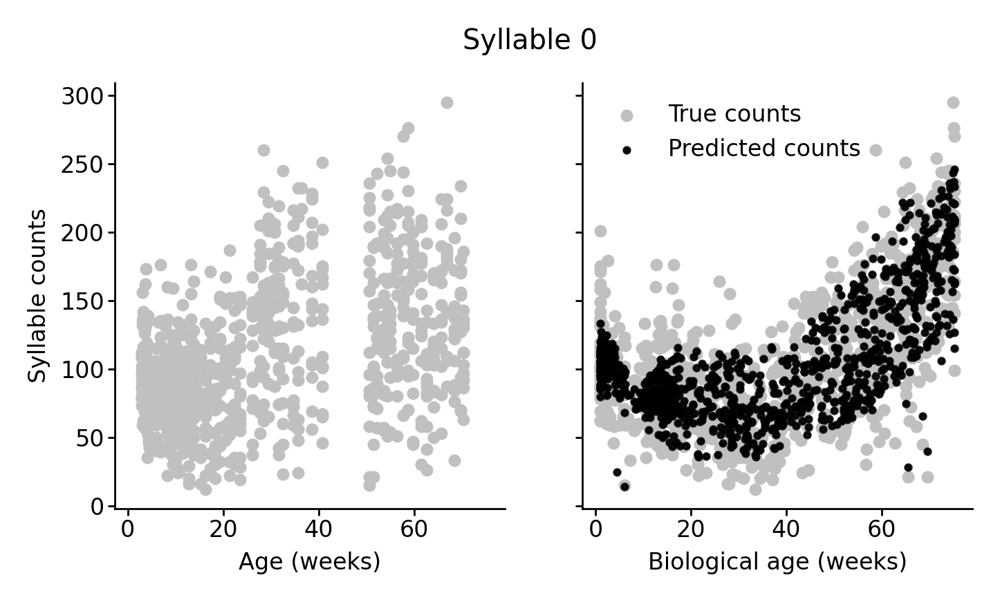

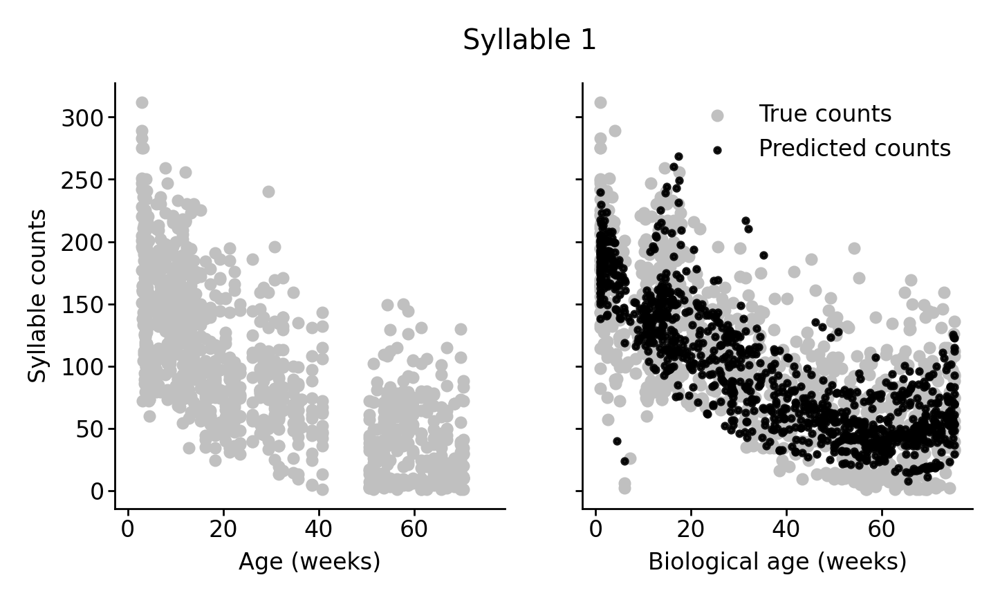

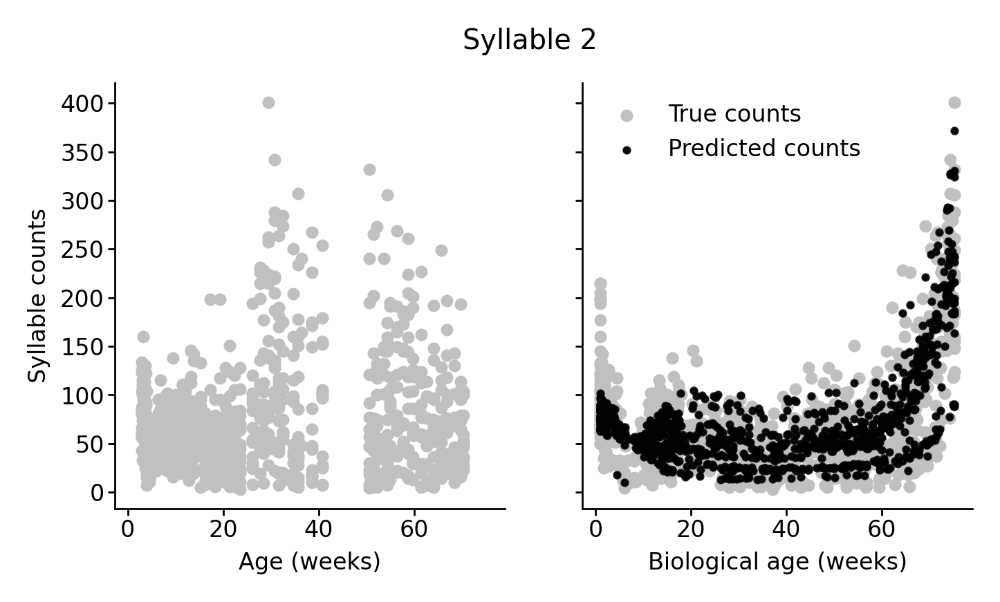

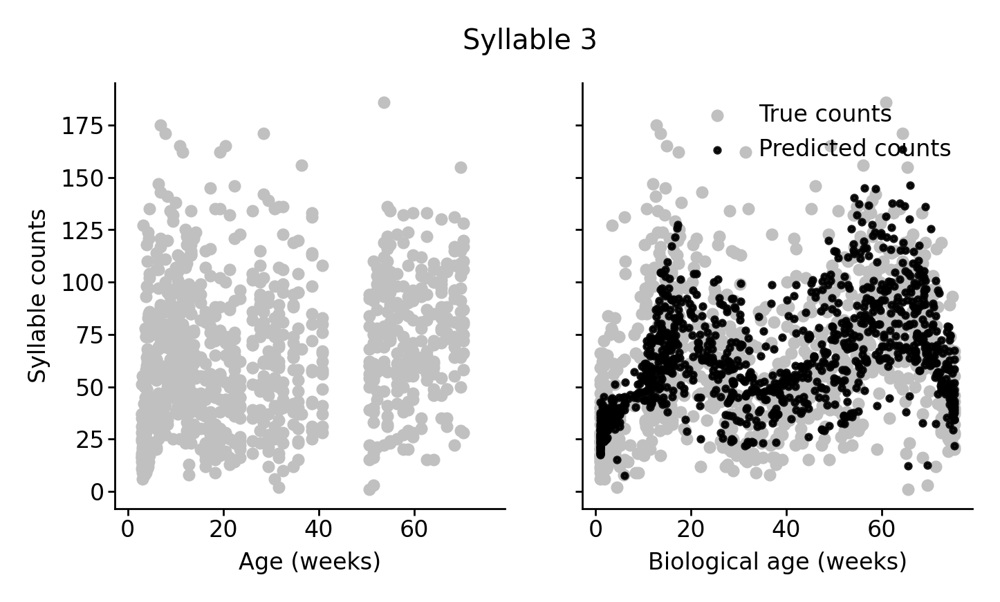

In [85]:
for syllable in range(4):
    to_plt = tmp4[0]
    comp = to_plt["init_components"]
    plt_df = pd.DataFrame(
        dict(
            age=to_plt["true_ages"],
            bio_age=to_plt["bio_ages"],
            pred_counts=to_plt["predicted_counts"][:, syllable],
            counts=to_plt["counts"][:, syllable],
        )
    )

    fig, ax = plt.subplots(1, 2, figsize=(4, 2), sharey=True, sharex=True)

    ax[0].scatter(plt_df["age"], plt_df["counts"], c="silver", s=6)
    ax[1].scatter(plt_df["bio_age"], plt_df["counts"], c="silver", s=6, label="True counts")
    ax[1].scatter(plt_df["bio_age"], plt_df["pred_counts"], c="k", s=2, alpha=0.9, label="Predicted counts")
    ax[1].set(xlabel="Biological age (weeks)")
    ax[0].set(xlabel="Age (weeks)", ylabel="Syllable counts")
    ax[1].legend(frameon=False)
    sns.despine()
    fig.suptitle(f"Syllable {syllable}")

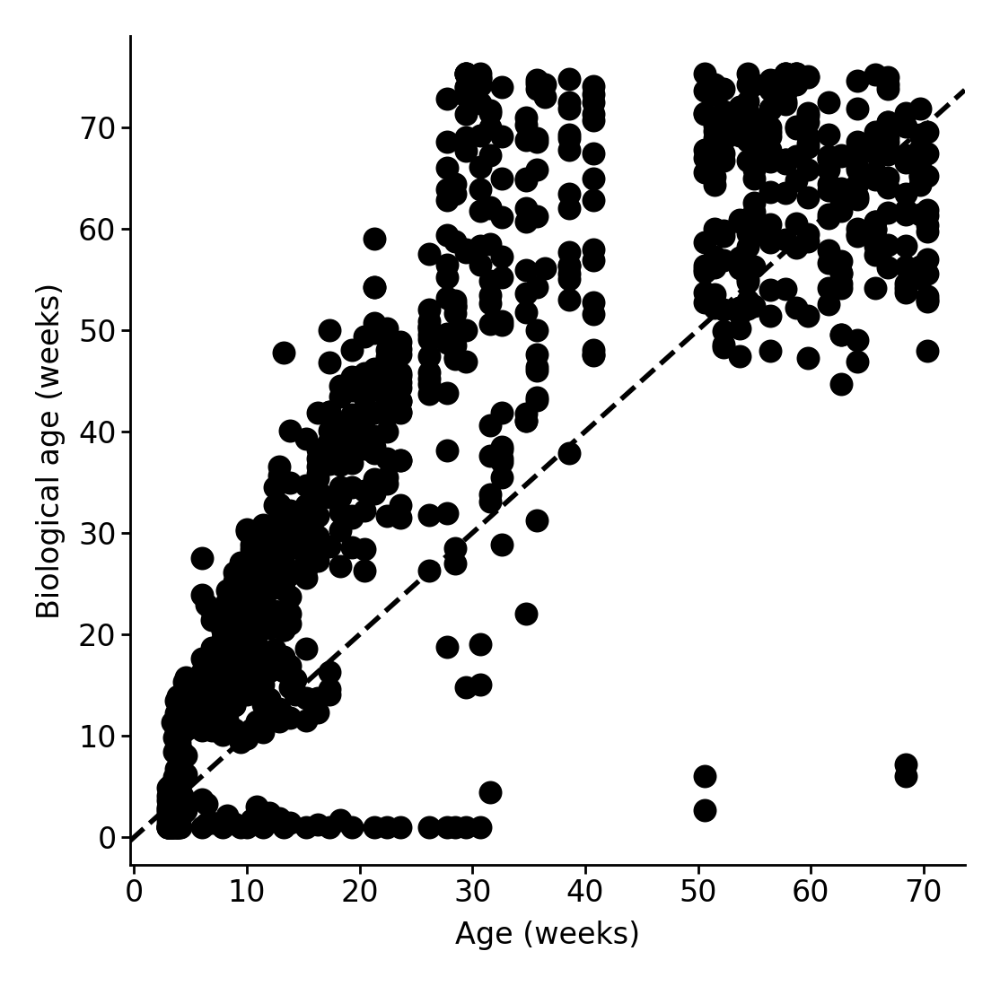

In [86]:
plt.scatter(tmp4[0]['true_ages'], tmp4[0]['bio_ages'], s=15, c='k')
plt.xlabel('Age (weeks)')
plt.ylabel("Biological age (weeks)")
add_identity(plt.gca(), c='k', ls='--', lw=1)
sns.despine()

## Dynamic individuality v2

In [8]:
tmp5 = masked_xval(features, hypparams, 5, n_repeats=1)

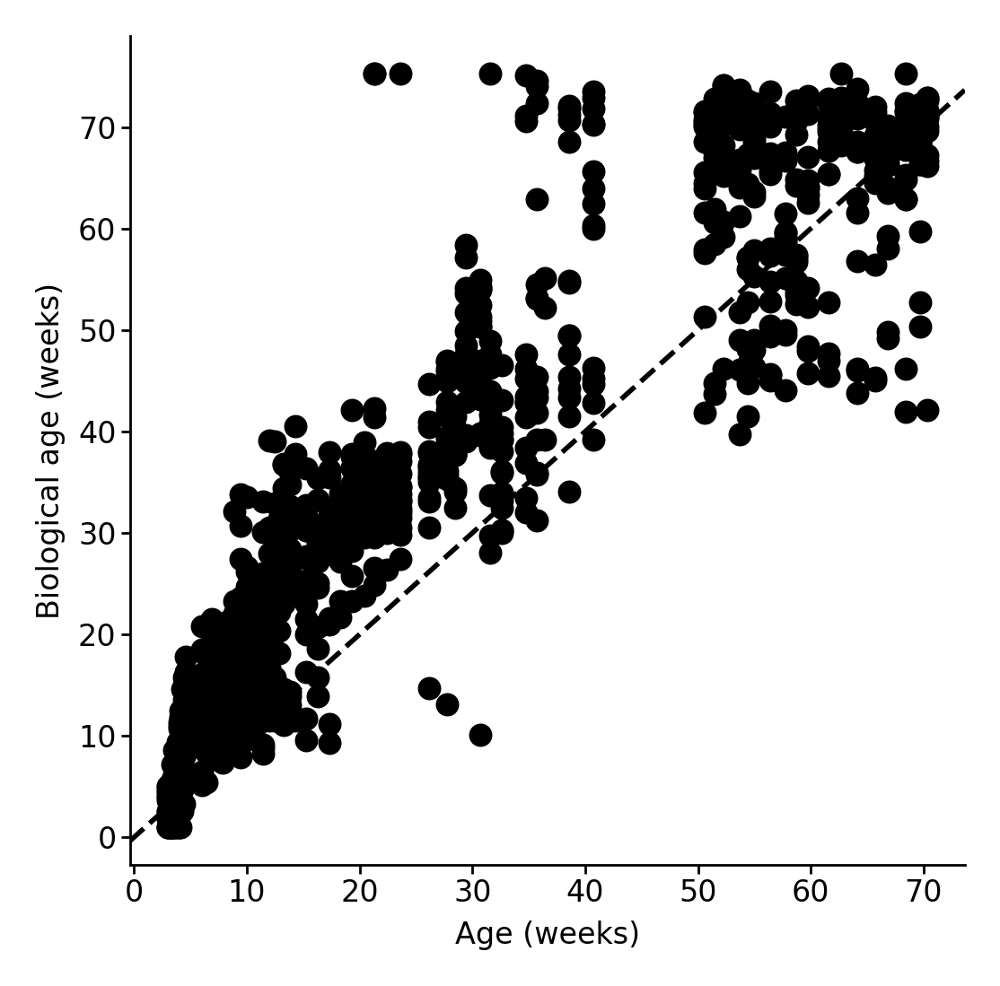

In [9]:
plt.scatter(tmp5[0]['true_ages'], tmp5[0]['bio_ages'], s=15, c='k')
plt.xlabel('Age (weeks)')
plt.ylabel("Biological age (weeks)")
add_identity(plt.gca(), c='k', ls='--', lw=1)
sns.despine()

In [10]:
tmp5[0]['params']['development_weights']

array([[0.07694816, 0.1281594 , 0.7251551 , 0.23972791, 0.40602037]],
      dtype=float32)

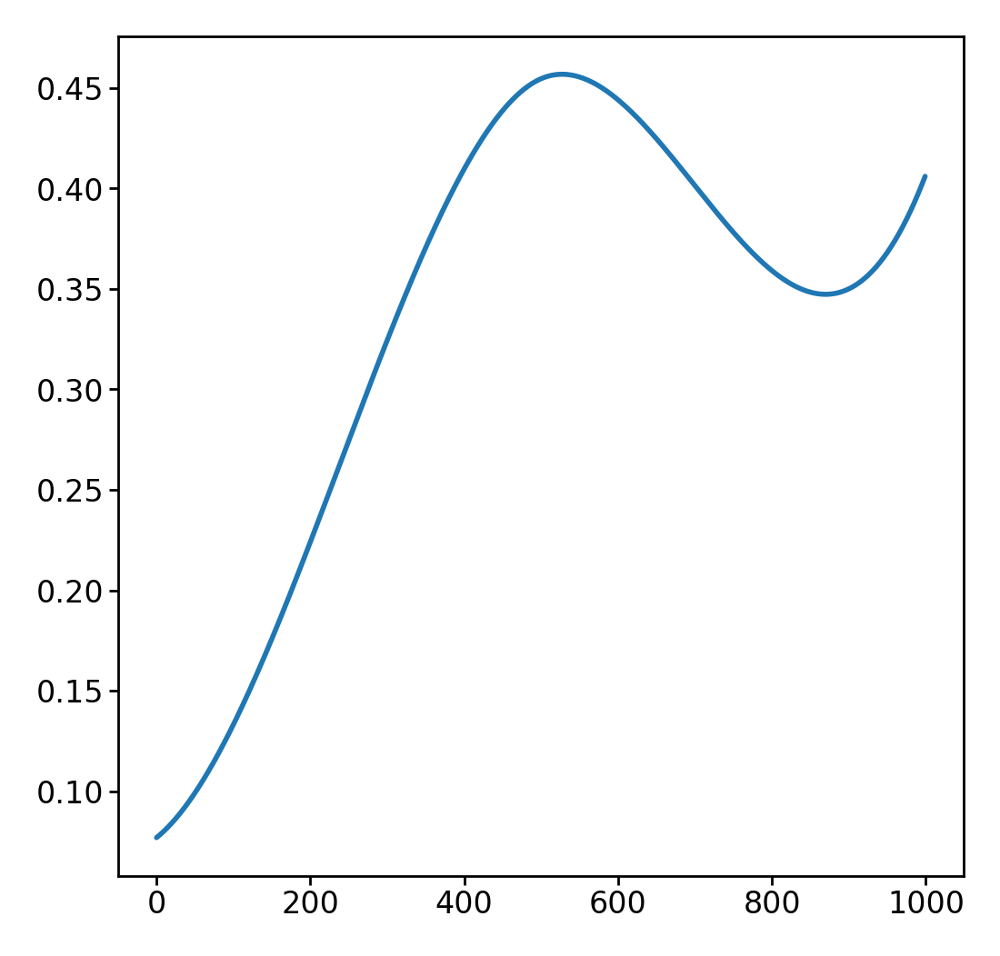

In [15]:
plt.plot(tmp5[0]['concentration_components']['indiv_scale'])

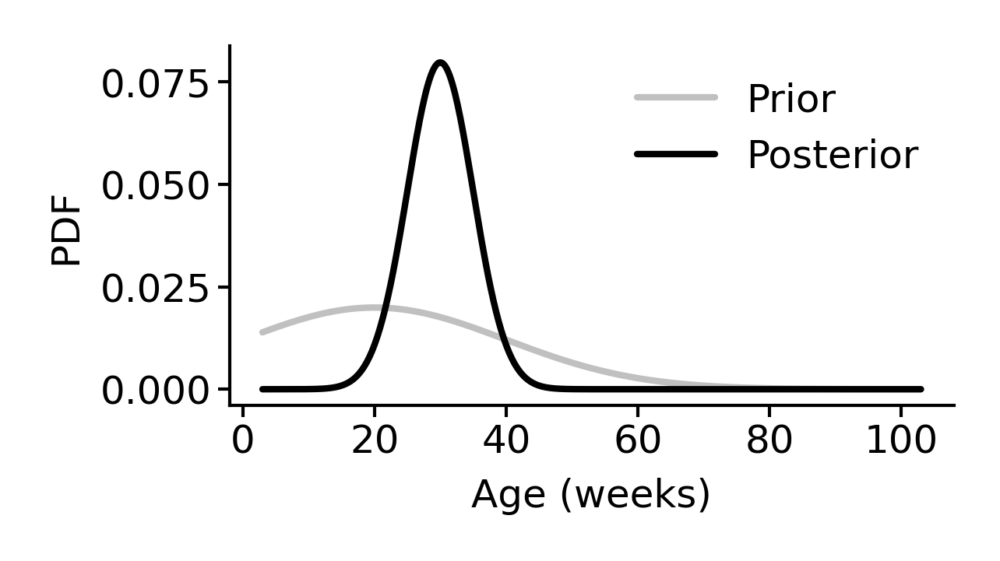

In [37]:
x = np.linspace(3, 103, 500)
mean = 20
std_dev = 20
pdf = 1/(std_dev * np.sqrt(2 * np.pi)) * np.exp(- (x - mean)**2 / (2 * std_dev**2))
figure(2, 1)
plt.plot(np.linspace(3, 103, 500), pdf, color='silver', label="Prior")
mean = 30
std_dev = 5
pdf = 1/(std_dev * np.sqrt(2 * np.pi)) * np.exp(- (x - mean)**2 / (2 * std_dev**2))
plt.plot(np.linspace(3, 103, 500), pdf, color='k', label="Posterior")
plt.legend(frameon=False)
plt.ylabel("PDF")
plt.xlabel("Age (weeks)")
sns.despine()